# Term Project

## *Analyze Confused student EEG brainwave data*

## (1)주제 선정 이유

신경계에서 뇌신경 사이에 신호가 전달될 때 생기는 전기의 흐름인 뇌파(brainwave)와 뇌전도(electroencephalography, EEG)에 관한<br>
데이터를 분석해 보고 의미 있는 결과를 시각화해보고 싶어서 찾던 도중, **kaggle**이라는 사이트에서 Confused student EEG<br>
brainwave 와 관련된 data set를 찾아서 분석해보고 싶었다. 데이터 분석 자체도 중요하지만 이번 기회에 시각화와 관련된 공부를<br>
더 해보고 싶어서 시각화에 중점을 두고 진행하려 한다. 

## (2)가설 정의

<뇌파를 이용한 장애인의 감정인식 모니터 및 문자입력기 개발> 7p에 의하면<br>
뇌파는 보통 0~50Hz 영역의 빠르기를 갖는 진동성분으로 구성되어 5단계로 세분화된다.<br>
델타(0~4Hz), 세타(4~8Hz), 알파(8~13Hz), 베타(13~30Hz), 감마(30~50Hz)로 구분된다.<br>
일반적으로 **델타, 세타파와 같이 느린 진동성분**이 많이 출현하면 졸리거나 **수면, 마취 상태와 같이 의식이 낮은 상태**이다.<br>
**베타, 감마파와 같이 빠른 진동성분**이 많이 출현하면 **지나친 각성, 불안,복잡한 정보처리 등의 각성이 높은 상태**로 알려져 있다.<br>
뇌의 고유리듬영역인 **알파파**의 경우 **편안하게 이완된 상태**일 때 높은 비중으로 출현한다.<br><br><br>
*따라서*<br>
- 베타, 감마파와 같은 빠른 진동성분이 많이 출현할 수록 더 혼란스러운 상태일 것이다. <br>
- 혼란스러워하는 피실험자의 수가 많을수록 혼란스러운 영상일 것이다.

## (3) 인터넷을 통한 데이터 획득

* kaggle 사이트에서 뇌파 데이터를 받아온다.
* 데이터를 가공하여, 분석이 가능하게끔 정리한다.
* 여러 파장 간의 상관 관계를 정리하고, 분석한다.
* 그래프나 차트 등 여러가지 방법을 활용하여 데이터를 정리하고 시각화한다.
___

## (4) 분석을 위한 데이터 가공

In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.graph_objects as go

### subject 목록 csv 파일 불러오기

In [2]:
demographic_info = pd.read_csv('C:/Users/gram/Desktop/confused-eeg/demographic_info.csv', index_col = 0, encoding = 'CP949')

In [3]:
demographic_info

,age,ethnicity,gender
subject ID,,,
0,25,Han Chinese,M
1,24,Han Chinese,M
2,31,English,M
3,28,Han Chinese,F
4,24,Bengali,M
5,24,Han Chinese,M
6,24,Han Chinese,M
7,25,Han Chinese,M
8,25,Han Chinese,M


### EEG dataset csv 파일 불러오기

In [4]:
EEG_data = pd.read_csv('C:/Users/gram/Desktop/confused-eeg/EEG_data.csv', encoding = 'CP949')

### Column 이름의 의미
- SubjectID
- VideoID
- Attention : Proprietary measure of mental focus
- Mediation : Proprietary measure of calmness
- Raw : Raw EEG signal
- Delta : 1-3 Hz of power spectrum
- Theta : 4-7 Hz of power spectrum
- Alpha1 : Lower 8-11 Hz of power spectrum
- Alpha2 : Higher 8-11 Hz of power spectrum
- Beta1 : Lower 12-29 Hz of power spectrum
- Beta2 : Higher 12-29 Hz of power spectrum
- Gamma1 : Lower 30-100 Hz of power spectrum
- Gamma2 : Higher 30-100 Hz of power spectrum
- predefinedlabel : whether the subject is expected to be confused
- user-definedlabeln : whether the subject is actually confused

In [5]:
EEG_data

,SubjectID,VideoID,Attention,Mediation,Raw,Delta,Theta,Alpha1,Alpha2,Beta1,Beta2,Gamma1,Gamma2,predefinedlabel,user-definedlabeln
0,0.0,0.0,56.0,43.0,278.0,301963.0,90612.0,33735.0,23991.0,27946.0,45097.0,33228.0,8293.0,0.0,0.0
1,0.0,0.0,40.0,35.0,-50.0,73787.0,28083.0,1439.0,2240.0,2746.0,3687.0,5293.0,2740.0,0.0,0.0
2,0.0,0.0,47.0,48.0,101.0,758353.0,383745.0,201999.0,62107.0,36293.0,130536.0,57243.0,25354.0,0.0,0.0
3,0.0,0.0,47.0,57.0,-5.0,2012240.0,129350.0,61236.0,17084.0,11488.0,62462.0,49960.0,33932.0,0.0,0.0
4,0.0,0.0,44.0,53.0,-8.0,1005145.0,354328.0,37102.0,88881.0,45307.0,99603.0,44790.0,29749.0,0.0,0.0
5,0.0,0.0,44.0,66.0,73.0,1786446.0,176766.0,59352.0,26157.0,15054.0,33669.0,33782.0,31750.0,0.0,0.0
6,0.0,0.0,43.0,69.0,130.0,635191.0,122446.0,90107.0,65072.0,36230.0,53019.0,62938.0,59307.0,0.0,0.0
7,0.0,0.0,40.0,61.0,-2.0,161098.0,12119.0,1963.0,809.0,1277.0,3186.0,3266.0,2518.0,0.0,0.0
8,0.0,0.0,43.0,69.0,17.0,492796.0,120998.0,63697.0,68242.0,10769.0,88403.0,73756.0,22676.0,0.0,0.0
9,0.0,0.0,47.0,69.0,-59.0,82048.0,116131.0,47317.0,26197.0,41642.0,28866.0,32551.0,41810.0,0.0,0.0


### 데이터 필터링
- Attention, Mediation, Raw column의 데이터값을 무엇을 의미하는지 사이트에 나와있지 않기 때문에 분석에서 제외한다.
- 새로운 dataframe인 df를 만들어준다.

In [6]:
df1 = EEG_data.iloc[:, :2]
df1

,SubjectID,VideoID
0,0.0,0.0
1,0.0,0.0
2,0.0,0.0
3,0.0,0.0
4,0.0,0.0
5,0.0,0.0
6,0.0,0.0
7,0.0,0.0
8,0.0,0.0
9,0.0,0.0


In [7]:
df2 = EEG_data.iloc[:, 5:]
df2

,Delta,Theta,Alpha1,Alpha2,Beta1,Beta2,Gamma1,Gamma2,predefinedlabel,user-definedlabeln
0,301963.0,90612.0,33735.0,23991.0,27946.0,45097.0,33228.0,8293.0,0.0,0.0
1,73787.0,28083.0,1439.0,2240.0,2746.0,3687.0,5293.0,2740.0,0.0,0.0
2,758353.0,383745.0,201999.0,62107.0,36293.0,130536.0,57243.0,25354.0,0.0,0.0
3,2012240.0,129350.0,61236.0,17084.0,11488.0,62462.0,49960.0,33932.0,0.0,0.0
4,1005145.0,354328.0,37102.0,88881.0,45307.0,99603.0,44790.0,29749.0,0.0,0.0
5,1786446.0,176766.0,59352.0,26157.0,15054.0,33669.0,33782.0,31750.0,0.0,0.0
6,635191.0,122446.0,90107.0,65072.0,36230.0,53019.0,62938.0,59307.0,0.0,0.0
7,161098.0,12119.0,1963.0,809.0,1277.0,3186.0,3266.0,2518.0,0.0,0.0
8,492796.0,120998.0,63697.0,68242.0,10769.0,88403.0,73756.0,22676.0,0.0,0.0
9,82048.0,116131.0,47317.0,26197.0,41642.0,28866.0,32551.0,41810.0,0.0,0.0


In [8]:
df = pd.concat([df1, df2], axis=1)
df

,SubjectID,VideoID,Delta,Theta,Alpha1,Alpha2,Beta1,Beta2,Gamma1,Gamma2,predefinedlabel,user-definedlabeln
0,0.0,0.0,301963.0,90612.0,33735.0,23991.0,27946.0,45097.0,33228.0,8293.0,0.0,0.0
1,0.0,0.0,73787.0,28083.0,1439.0,2240.0,2746.0,3687.0,5293.0,2740.0,0.0,0.0
2,0.0,0.0,758353.0,383745.0,201999.0,62107.0,36293.0,130536.0,57243.0,25354.0,0.0,0.0
3,0.0,0.0,2012240.0,129350.0,61236.0,17084.0,11488.0,62462.0,49960.0,33932.0,0.0,0.0
4,0.0,0.0,1005145.0,354328.0,37102.0,88881.0,45307.0,99603.0,44790.0,29749.0,0.0,0.0
5,0.0,0.0,1786446.0,176766.0,59352.0,26157.0,15054.0,33669.0,33782.0,31750.0,0.0,0.0
6,0.0,0.0,635191.0,122446.0,90107.0,65072.0,36230.0,53019.0,62938.0,59307.0,0.0,0.0
7,0.0,0.0,161098.0,12119.0,1963.0,809.0,1277.0,3186.0,3266.0,2518.0,0.0,0.0
8,0.0,0.0,492796.0,120998.0,63697.0,68242.0,10769.0,88403.0,73756.0,22676.0,0.0,0.0
9,0.0,0.0,82048.0,116131.0,47317.0,26197.0,41642.0,28866.0,32551.0,41810.0,0.0,0.0


In [9]:
df3 = pd.DataFrame({'num': list(df.index.values)})

In [10]:
df = pd.concat([df3, df], axis=1)
df

,num,SubjectID,VideoID,Delta,Theta,Alpha1,Alpha2,Beta1,Beta2,Gamma1,Gamma2,predefinedlabel,user-definedlabeln
0,0,0.0,0.0,301963.0,90612.0,33735.0,23991.0,27946.0,45097.0,33228.0,8293.0,0.0,0.0
1,1,0.0,0.0,73787.0,28083.0,1439.0,2240.0,2746.0,3687.0,5293.0,2740.0,0.0,0.0
2,2,0.0,0.0,758353.0,383745.0,201999.0,62107.0,36293.0,130536.0,57243.0,25354.0,0.0,0.0
3,3,0.0,0.0,2012240.0,129350.0,61236.0,17084.0,11488.0,62462.0,49960.0,33932.0,0.0,0.0
4,4,0.0,0.0,1005145.0,354328.0,37102.0,88881.0,45307.0,99603.0,44790.0,29749.0,0.0,0.0
5,5,0.0,0.0,1786446.0,176766.0,59352.0,26157.0,15054.0,33669.0,33782.0,31750.0,0.0,0.0
6,6,0.0,0.0,635191.0,122446.0,90107.0,65072.0,36230.0,53019.0,62938.0,59307.0,0.0,0.0
7,7,0.0,0.0,161098.0,12119.0,1963.0,809.0,1277.0,3186.0,3266.0,2518.0,0.0,0.0
8,8,0.0,0.0,492796.0,120998.0,63697.0,68242.0,10769.0,88403.0,73756.0,22676.0,0.0,0.0
9,9,0.0,0.0,82048.0,116131.0,47317.0,26197.0,41642.0,28866.0,32551.0,41810.0,0.0,0.0


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12811 entries, 0 to 12810
Data columns (total 13 columns):
num                   12811 non-null int64
SubjectID             12811 non-null float64
VideoID               12811 non-null float64
Delta                 12811 non-null float64
Theta                 12811 non-null float64
Alpha1                12811 non-null float64
Alpha2                12811 non-null float64
Beta1                 12811 non-null float64
Beta2                 12811 non-null float64
Gamma1                12811 non-null float64
Gamma2                12811 non-null float64
predefinedlabel       12811 non-null float64
user-definedlabeln    12811 non-null float64
dtypes: float64(12), int64(1)
memory usage: 1.3 MB


#### df 데이터값의 type 변환해주기
- float type으로는 그래프가 그려지지 않았기 때문에 int type으로 변환해준다.

In [12]:
df = df.astype(int)
df

,num,SubjectID,VideoID,Delta,Theta,Alpha1,Alpha2,Beta1,Beta2,Gamma1,Gamma2,predefinedlabel,user-definedlabeln
0,0,0,0,301963,90612,33735,23991,27946,45097,33228,8293,0,0
1,1,0,0,73787,28083,1439,2240,2746,3687,5293,2740,0,0
2,2,0,0,758353,383745,201999,62107,36293,130536,57243,25354,0,0
3,3,0,0,2012240,129350,61236,17084,11488,62462,49960,33932,0,0
4,4,0,0,1005145,354328,37102,88881,45307,99603,44790,29749,0,0
5,5,0,0,1786446,176766,59352,26157,15054,33669,33782,31750,0,0
6,6,0,0,635191,122446,90107,65072,36230,53019,62938,59307,0,0
7,7,0,0,161098,12119,1963,809,1277,3186,3266,2518,0,0
8,8,0,0,492796,120998,63697,68242,10769,88403,73756,22676,0,0
9,9,0,0,82048,116131,47317,26197,41642,28866,32551,41810,0,0


In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12811 entries, 0 to 12810
Data columns (total 13 columns):
num                   12811 non-null int32
SubjectID             12811 non-null int32
VideoID               12811 non-null int32
Delta                 12811 non-null int32
Theta                 12811 non-null int32
Alpha1                12811 non-null int32
Alpha2                12811 non-null int32
Beta1                 12811 non-null int32
Beta2                 12811 non-null int32
Gamma1                12811 non-null int32
Gamma2                12811 non-null int32
predefinedlabel       12811 non-null int32
user-definedlabeln    12811 non-null int32
dtypes: int32(13)
memory usage: 650.6 KB


### i번째 피실험자 dataframe 만들기
- df는 10개의 SubjectID와 10개의 VideoID로 이루어진 dataframe이다.
- i번째 subject의 8가지 파장의 뇌파로 이루어진 dataframe의 이름을 df_subi로 설정했다.

In [14]:
df3 = df.loc[df["SubjectID"] == 0, 'num':'VideoID']
df4 = df.loc[df["SubjectID"] == 0, 'Delta':'Gamma2'] 
df_sub0 = pd.concat([df3, df4], axis=1)
df_sub0

,num,SubjectID,VideoID,Delta,Theta,Alpha1,Alpha2,Beta1,Beta2,Gamma1,Gamma2
0,0,0,0,301963,90612,33735,23991,27946,45097,33228,8293
1,1,0,0,73787,28083,1439,2240,2746,3687,5293,2740
2,2,0,0,758353,383745,201999,62107,36293,130536,57243,25354
3,3,0,0,2012240,129350,61236,17084,11488,62462,49960,33932
4,4,0,0,1005145,354328,37102,88881,45307,99603,44790,29749
5,5,0,0,1786446,176766,59352,26157,15054,33669,33782,31750
6,6,0,0,635191,122446,90107,65072,36230,53019,62938,59307
7,7,0,0,161098,12119,1963,809,1277,3186,3266,2518
8,8,0,0,492796,120998,63697,68242,10769,88403,73756,22676
9,9,0,0,82048,116131,47317,26197,41642,28866,32551,41810


In [15]:
df1 = df.loc[df["SubjectID"] == 1, 'num':'VideoID']
df2 = df.loc[df["SubjectID"] == 1, 'Delta':'Gamma2'] 
df_sub1 = pd.concat([df1, df2], axis=1)
df_sub1

,num,SubjectID,VideoID,Delta,Theta,Alpha1,Alpha2,Beta1,Beta2,Gamma1,Gamma2
1261,1261,1,0,216055,132532,11941,14898,25188,20308,33313,12106
1262,1262,1,0,468362,35861,11405,23870,10091,8933,6418,7495
1263,1263,1,0,1932255,203451,49856,126151,23660,21476,15950,15970
1264,1264,1,0,1837164,625492,45235,28132,37302,21803,63472,31469
1265,1265,1,0,19733,6188,5721,3919,14817,14038,4439,3570
1266,1266,1,0,482666,388508,74938,47827,21086,24981,9317,10642
1267,1267,1,0,234018,20182,19006,5920,13180,9100,2334,935
1268,1268,1,0,954404,279859,30468,16026,60851,5104,8895,7825
1269,1269,1,0,28183,33005,20626,13880,10402,5884,3352,2144
1270,1270,1,0,347956,29095,12957,11037,14887,7126,4774,3554


In [16]:
df1 = df.loc[df["SubjectID"] == 2, 'num':'VideoID']
df2 = df.loc[df["SubjectID"] == 2, 'Delta':'Gamma2'] 
df_sub2 = pd.concat([df1, df2], axis=1)
df_sub2 

,num,SubjectID,VideoID,Delta,Theta,Alpha1,Alpha2,Beta1,Beta2,Gamma1,Gamma2
2562,2562,2,0,53205,57329,12391,27427,16770,9865,11115,9341
2563,2563,2,0,6462,8890,3962,2136,2675,9450,2954,7799
2564,2564,2,0,17212,5253,4223,2602,6320,5448,8008,10395
2565,2565,2,0,9290,14085,7690,1570,2624,6177,2552,3274
2566,2566,2,0,4037,3585,3077,2692,5564,6355,9083,3739
2567,2567,2,0,8917,10984,5993,1884,6039,15704,2986,1533
2568,2568,2,0,3753,8804,2659,2204,8594,5892,2937,3878
2569,2569,2,0,14200,8826,2499,5586,4046,6274,3141,4813
2570,2570,2,0,22821,52217,4310,3151,10528,11522,4372,3255
2571,2571,2,0,4938,6320,4886,3734,9427,6654,3260,2370


In [17]:
df1 = df.loc[df["SubjectID"] == 3, 'num':'VideoID']
df2 = df.loc[df["SubjectID"] == 3, 'Delta':'Gamma2'] 
df_sub3 = pd.concat([df1, df2], axis=1)
df_sub3

,num,SubjectID,VideoID,Delta,Theta,Alpha1,Alpha2,Beta1,Beta2,Gamma1,Gamma2
3846,3846,3,0,1307676,64069,95902,12350,5634,12578,9057,4476
3847,3847,3,0,1927384,34629,28219,13460,19248,39548,17960,1958
3848,3848,3,0,596791,19558,29862,45536,27673,22275,25852,2254
3849,3849,3,0,270264,13624,20495,7160,5626,3992,6379,9981
3850,3850,3,0,506337,185656,346917,179920,46672,93178,131956,10751
3851,3851,3,0,86919,36270,4187,5757,704,17859,1815,394
3852,3852,3,0,2187100,470497,126778,260954,69471,82776,34249,5392
3853,3853,3,0,430300,112954,24257,25903,8556,17215,10223,792
3854,3854,3,0,1556687,594086,215155,268960,58463,173546,60957,8502
3855,3855,3,0,2325765,63424,86304,19275,20676,21754,19889,1250


In [18]:
df1 = df.loc[df["SubjectID"] == 4, 'num':'VideoID']
df2 = df.loc[df["SubjectID"] == 4, 'Delta':'Gamma2'] 
df_sub4 = pd.concat([df1, df2], axis=1)
df_sub4

,num,SubjectID,VideoID,Delta,Theta,Alpha1,Alpha2,Beta1,Beta2,Gamma1,Gamma2
5160,5160,4,0,395978,70226,18716,10762,16668,15609,32104,12985
5161,5161,4,0,1423848,541864,175496,68333,840994,148337,299686,202597
5162,5162,4,0,693991,1069402,94920,277785,324961,118081,250073,173072
5163,5163,4,0,1176502,55593,18450,13026,4607,7742,2305,3118
5164,5164,4,0,15596,31736,5861,3903,9415,19686,11929,19889
5165,5165,4,0,155186,80860,55323,23074,21598,31037,19469,10084
5166,5166,4,0,187320,13755,6166,3309,2917,22173,6046,7612
5167,5167,4,0,8357,16677,5552,10539,11569,18925,16166,9890
5168,5168,4,0,490400,157867,151232,38451,42849,13624,10091,13292
5169,5169,4,0,9944,14890,7160,3558,4868,15249,12444,10941


In [19]:
df1 = df.loc[df["SubjectID"] == 5, 'num':'VideoID']
df2 = df.loc[df["SubjectID"] == 5, 'Delta':'Gamma2'] 
df_sub5 = pd.concat([df1, df2], axis=1)
df_sub5

,num,SubjectID,VideoID,Delta,Theta,Alpha1,Alpha2,Beta1,Beta2,Gamma1,Gamma2
6455,6455,5,0,1086865,249855,36152,101382,20690,30528,30960,4636
6456,6456,5,0,1793473,185457,25183,70956,38014,66375,20948,3754
6457,6457,5,0,1609180,1015545,99739,77246,53555,58276,13298,10898
6458,6458,5,0,1103185,85090,35392,4526,10010,8580,3538,2201
6459,6459,5,0,34339,31226,2185,3088,636,1735,1429,255
6460,6460,5,0,225220,102067,3217,20504,3489,15886,5287,668
6461,6461,5,0,246075,115042,58866,14891,7042,5027,5463,857
6462,6462,5,0,203259,43447,3983,24201,4343,12224,6133,1564
6463,6463,5,0,13269,23093,4123,7842,1546,2075,1415,309
6464,6464,5,0,566754,168010,37767,19149,4149,17932,7326,1790


In [20]:
df1 = df.loc[df["SubjectID"] == 6, 'num':'VideoID']
df2 = df.loc[df["SubjectID"] == 6, 'Delta':'Gamma2'] 
df_sub6 = pd.concat([df1, df2], axis=1)
df_sub6

,num,SubjectID,VideoID,Delta,Theta,Alpha1,Alpha2,Beta1,Beta2,Gamma1,Gamma2
7717,7717,6,0,493042,58588,48157,22146,18002,28329,18930,8859
7718,7718,6,0,399516,115933,13360,16585,22777,10513,15767,4777
7719,7719,6,0,3038386,2417589,77769,392542,216529,662647,198248,284286
7720,7720,6,0,928248,506625,172735,266638,76342,105064,67176,80974
7721,7721,6,0,1019488,323193,190457,183909,124942,94278,73541,44500
7722,7722,6,0,50764,5692,1034,4051,6952,7016,4102,3775
7723,7723,6,0,691870,120794,94319,345095,97436,145042,39903,93196
7724,7724,6,0,526900,478313,43125,215129,52625,105904,179900,56323
7725,7725,6,0,90315,14564,340,1543,6669,2185,2643,3329
7726,7726,6,0,1059928,641314,145033,57412,77779,85649,105684,84477


In [21]:
df1 = df.loc[df["SubjectID"] == 7, 'num':'VideoID']
df2 = df.loc[df["SubjectID"] == 7, 'Delta':'Gamma2'] 
df_sub7 = pd.concat([df1, df2], axis=1)
df_sub7

,num,SubjectID,VideoID,Delta,Theta,Alpha1,Alpha2,Beta1,Beta2,Gamma1,Gamma2
8992,8992,7,0,1254678,161779,5961,4494,4025,10571,26004,9110
8993,8993,7,0,661316,549140,70649,71962,78256,16329,48489,31617
8994,8994,7,0,337676,350789,107286,51815,32766,59830,124521,22224
8995,8995,7,0,1321234,51717,8487,4826,19868,11361,29265,10915
8996,8996,7,0,874722,900786,58811,53148,33997,84364,54846,38699
8997,8997,7,0,379526,136868,28552,19973,10124,25462,58558,35281
8998,8998,7,0,2376032,377033,212401,13388,30186,61878,29436,29974
8999,8999,7,0,2029891,263598,97414,13547,79699,41647,62426,39610
9000,9000,7,0,823453,89386,2601,7046,11444,14295,21022,4545
9001,9001,7,0,395231,111198,6750,13647,20562,74714,17766,20554


In [22]:
df1 = df.loc[df["SubjectID"] == 8, 'num':'VideoID']
df2 = df.loc[df["SubjectID"] == 8, 'Delta':'Gamma2'] 
df_sub8 = pd.concat([df1, df2], axis=1)
df_sub8

,num,SubjectID,VideoID,Delta,Theta,Alpha1,Alpha2,Beta1,Beta2,Gamma1,Gamma2
10268,10268,8,0,1323080,118883,6860,21249,11997,14061,6635,14865
10269,10269,8,0,1440162,756888,92043,69805,40756,20189,15601,15499
10270,10270,8,0,1060945,943558,334295,19878,50913,52561,31696,15191
10271,10271,8,0,97339,97837,13936,3817,2788,2316,3352,816
10272,10272,8,0,117876,129110,28236,4214,8432,13930,10441,5900
10273,10273,8,0,1179563,168700,24563,31610,30675,7028,9957,11092
10274,10274,8,0,1182233,122192,57640,25384,8094,9207,8768,4874
10275,10275,8,0,794587,149015,29547,15079,16456,13463,7275,3227
10276,10276,8,0,293670,503563,55117,19997,15257,41582,24183,12511
10277,10277,8,0,925150,87477,6012,5563,4935,5051,1863,2048


In [23]:
df1 = df.loc[df["SubjectID"] == 9, 'num':'VideoID']
df2 = df.loc[df["SubjectID"] == 9, 'Delta':'Gamma2'] 
df_sub9 = pd.concat([df1, df2], axis=1)
df_sub9

,num,SubjectID,VideoID,Delta,Theta,Alpha1,Alpha2,Beta1,Beta2,Gamma1,Gamma2
11550,11550,9,0,1184061,41756,26010,27986,7728,31457,13142,1602
11551,11551,9,0,2668588,250068,48031,144719,45339,71683,43788,8778
11552,11552,9,0,1702297,395793,7732,333101,8756,62117,98710,4782
11553,11553,9,0,97613,5663,14383,4286,672,31207,2339,225
11554,11554,9,0,1643278,70092,18286,50412,12175,83076,9773,1960
11555,11555,9,0,856773,46002,11171,37886,5148,24443,15883,2304
11556,11556,9,0,526675,165445,49914,33027,3982,15154,21753,1868
11557,11557,9,0,103713,15019,3287,5091,1129,27492,944,458
11558,11558,9,0,436400,8463,3905,4673,7469,14784,4435,1368
11559,11559,9,0,183382,17513,5042,3120,3132,3203,11712,192


## (5)분석 결과 도출

### len(df_sub) 그래프 그리기
- 각각의 df_sub의 길이가 다르므로 길이로 이루어진 list를 만들었고 그래프를 그렸다.
- 그래프를 그릴 때 matplotlib의 plot를 사용했고, 이때 마지막 인자에서 색상과 마커의 모양을 설정할 수 있다.<br><br>

b - blue(파란색)<br>
g -	green(녹색)<br>
r -	red(빨간색)<br>
c -	cyan(청록색)<br>
m -	magenta(마젠타색)<br>
y -	yellow(노란색)<br>
k -	black(검은색)<br>
w -	white(흰색)<br><br>

o -	circle(원)<br>
v -	triangle_down(역 삼각형)<br>
^ -	triangle_up(삼각형)<br>
s -	square(네모)<br>
'+' - plus(플러스)<br>
. -	point(점)<br>
p - pentagon(오각형)<br>
'*' - star(별)<br>
h -	hexagon1(육각형1)<br>
H -	hexagon2(육각형2)<br>
x -	x(x)<br>
D -	diamond(다이아몬드)<br>
d -	thin_diamond(얇은 다이아)<br>


In [24]:
df_list= [df_sub0, df_sub1, df_sub2, df_sub3, df_sub4, df_sub5, df_sub6, df_sub7, df_sub8, df_sub9]
df_sub_len = list(map(lambda x:len(x), df_list))

df_sub_len

[1261, 1301, 1284, 1314, 1295, 1262, 1275, 1276, 1282, 1261]

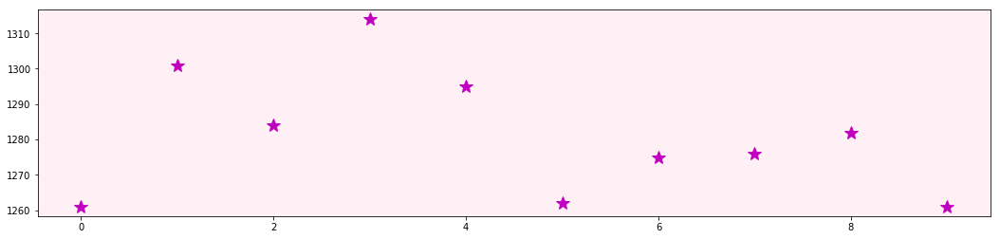

In [25]:
x = range(0, 10)
y = df_sub_len
plt.figure(figsize=(18,4))
ax = plt.axes()
ax.set_facecolor("lavenderblush")
plt.plot(x, y,'m*', markersize = 15)

In [26]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_sub0['num'], y=df_sub0['Delta'], name="Delta", line_color='mediumpurple'))
fig.add_trace(go.Scatter(x=df_sub0['num'], y=df_sub0['Theta'], name="Theta", line_color='plum'))
fig.add_trace(go.Scatter(x=df_sub0['num'], y=df_sub0['Alpha1'], name="Alpha1", line_color='paleturquoise'))
fig.add_trace(go.Scatter(x=df_sub0['num'], y=df_sub0['Alpha2'], name="Alpha2", line_color='violet'))
fig.add_trace(go.Scatter(x=df_sub0['num'], y=df_sub0['Beta1'], name="Beta1", line_color='gold'))
fig.add_trace(go.Scatter(x=df_sub0['num'], y=df_sub0['Beta2'], name="Beta2", line_color='palevioletred'))
fig.add_trace(go.Scatter(x=df_sub0['num'], y=df_sub0['Gamma1'], name="Gamma1", line_color='lightcoral'))
fig.add_trace(go.Scatter(x=df_sub0['num'], y=df_sub0['Gamma2'], name="Gamma2", line_color='pink'))
fig.update_layout(title_text='<Brain waves of Subject0>', xaxis_rangeslider_visible = False)
fig.update_layout(autosize=False, width=1100, height=400, margin=go.layout.Margin(l=50, r=50, b=100, t=100, pad=4),
    paper_bgcolor="aliceblue")
fig.show()

In [27]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_sub1['num'], y=df_sub1['Delta'], name="Delta", line_color='mediumpurple'))
fig.add_trace(go.Scatter(x=df_sub1['num'], y=df_sub1['Theta'], name="Theta", line_color='plum'))
fig.add_trace(go.Scatter(x=df_sub1['num'], y=df_sub1['Alpha1'], name="Alpha1", line_color='paleturquoise'))
fig.add_trace(go.Scatter(x=df_sub1['num'], y=df_sub1['Alpha2'], name="Alpha2", line_color='violet'))
fig.add_trace(go.Scatter(x=df_sub1['num'], y=df_sub1['Beta1'], name="Beta1", line_color='gold'))
fig.add_trace(go.Scatter(x=df_sub1['num'], y=df_sub1['Beta2'], name="Beta2", line_color='palevioletred'))
fig.add_trace(go.Scatter(x=df_sub1['num'], y=df_sub1['Gamma1'], name="Gamma1", line_color='lightcoral'))
fig.add_trace(go.Scatter(x=df_sub1['num'], y=df_sub1['Gamma2'], name="Gamma2", line_color='pink'))
fig.update_layout(title_text='<Brain waves of Subject1>', xaxis_rangeslider_visible = False)
fig.update_layout(autosize=False, width=1100, height=400, margin=go.layout.Margin(l=50, r=50, b=100, t=100, pad=4),
    paper_bgcolor="aliceblue")
fig.show()

In [28]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_sub2['num'], y=df_sub2['Delta'], name="Delta", line_color='mediumpurple'))
fig.add_trace(go.Scatter(x=df_sub2['num'], y=df_sub2['Theta'], name="Theta", line_color='plum'))
fig.add_trace(go.Scatter(x=df_sub2['num'], y=df_sub2['Alpha1'], name="Alpha1", line_color='paleturquoise'))
fig.add_trace(go.Scatter(x=df_sub2['num'], y=df_sub2['Alpha2'], name="Alpha2", line_color='violet'))
fig.add_trace(go.Scatter(x=df_sub2['num'], y=df_sub2['Beta1'], name="Beta1", line_color='gold'))
fig.add_trace(go.Scatter(x=df_sub2['num'], y=df_sub2['Beta2'], name="Beta2", line_color='palevioletred'))
fig.add_trace(go.Scatter(x=df_sub2['num'], y=df_sub2['Gamma1'], name="Gamma1", line_color='lightcoral'))
fig.add_trace(go.Scatter(x=df_sub2['num'], y=df_sub2['Gamma2'], name="Gamma2", line_color='pink'))
fig.update_layout(title_text='<Brain waves of Subject2>', xaxis_rangeslider_visible = False)
fig.update_layout(autosize=False, width=1100, height=400, margin=go.layout.Margin(l=50, r=50, b=100, t=100, pad=4),
    paper_bgcolor="aliceblue")
fig.show()

In [29]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_sub3['num'], y=df_sub3['Delta'], name="Delta", line_color='mediumpurple'))
fig.add_trace(go.Scatter(x=df_sub3['num'], y=df_sub3['Theta'], name="Theta", line_color='plum'))
fig.add_trace(go.Scatter(x=df_sub3['num'], y=df_sub3['Alpha1'], name="Alpha1", line_color='paleturquoise'))
fig.add_trace(go.Scatter(x=df_sub3['num'], y=df_sub3['Alpha2'], name="Alpha2", line_color='violet'))
fig.add_trace(go.Scatter(x=df_sub3['num'], y=df_sub3['Beta1'], name="Beta1", line_color='gold'))
fig.add_trace(go.Scatter(x=df_sub3['num'], y=df_sub3['Beta2'], name="Beta2", line_color='palevioletred'))
fig.add_trace(go.Scatter(x=df_sub3['num'], y=df_sub3['Gamma1'], name="Gamma1", line_color='lightcoral'))
fig.add_trace(go.Scatter(x=df_sub3['num'], y=df_sub3['Gamma2'], name="Gamma2", line_color='pink'))
fig.update_layout(title_text='<Brain waves of Subject3>', xaxis_rangeslider_visible = False)
fig.update_layout(autosize=False, width=1100, height=400, margin=go.layout.Margin(l=50, r=50, b=100, t=100, pad=4),
    paper_bgcolor="aliceblue")
fig.show()

In [30]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_sub4['num'], y=df_sub4['Delta'], name="Delta", line_color='mediumpurple'))
fig.add_trace(go.Scatter(x=df_sub4['num'], y=df_sub4['Theta'], name="Theta", line_color='plum'))
fig.add_trace(go.Scatter(x=df_sub4['num'], y=df_sub4['Alpha1'], name="Alpha1", line_color='paleturquoise'))
fig.add_trace(go.Scatter(x=df_sub4['num'], y=df_sub4['Alpha2'], name="Alpha2", line_color='violet'))
fig.add_trace(go.Scatter(x=df_sub4['num'], y=df_sub4['Beta1'], name="Beta1", line_color='gold'))
fig.add_trace(go.Scatter(x=df_sub4['num'], y=df_sub4['Beta2'], name="Beta2", line_color='palevioletred'))
fig.add_trace(go.Scatter(x=df_sub4['num'], y=df_sub4['Gamma1'], name="Gamma1", line_color='lightcoral'))
fig.add_trace(go.Scatter(x=df_sub4['num'], y=df_sub4['Gamma2'], name="Gamma2", line_color='pink'))
fig.update_layout(title_text='<Brain waves of Subject4>', xaxis_rangeslider_visible = False)
fig.update_layout(autosize=False, width=1100, height=400, margin=go.layout.Margin(l=50, r=50, b=100, t=100, pad=4),
    paper_bgcolor="aliceblue")
fig.show()

In [31]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_sub5['num'], y=df_sub5['Delta'], name="Delta", line_color='mediumpurple'))
fig.add_trace(go.Scatter(x=df_sub5['num'], y=df_sub5['Theta'], name="Theta", line_color='plum'))
fig.add_trace(go.Scatter(x=df_sub5['num'], y=df_sub5['Alpha1'], name="Alpha1", line_color='paleturquoise'))
fig.add_trace(go.Scatter(x=df_sub5['num'], y=df_sub5['Alpha2'], name="Alpha2", line_color='violet'))
fig.add_trace(go.Scatter(x=df_sub5['num'], y=df_sub5['Beta1'], name="Beta1", line_color='gold'))
fig.add_trace(go.Scatter(x=df_sub5['num'], y=df_sub5['Beta2'], name="Beta2", line_color='palevioletred'))
fig.add_trace(go.Scatter(x=df_sub5['num'], y=df_sub5['Gamma1'], name="Gamma1", line_color='lightcoral'))
fig.add_trace(go.Scatter(x=df_sub5['num'], y=df_sub5['Gamma2'], name="Gamma2", line_color='pink'))
fig.update_layout(title_text='<Brain waves of Subject5>', xaxis_rangeslider_visible = False)
fig.update_layout(autosize=False, width=1100, height=400, margin=go.layout.Margin(l=50, r=50, b=100, t=100, pad=4),
    paper_bgcolor="aliceblue")
fig.show()

In [32]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_sub6['num'], y=df_sub6['Delta'], name="Delta", line_color='mediumpurple'))
fig.add_trace(go.Scatter(x=df_sub6['num'], y=df_sub6['Theta'], name="Theta", line_color='plum'))
fig.add_trace(go.Scatter(x=df_sub6['num'], y=df_sub6['Alpha1'], name="Alpha1", line_color='paleturquoise'))
fig.add_trace(go.Scatter(x=df_sub6['num'], y=df_sub6['Alpha2'], name="Alpha2", line_color='violet'))
fig.add_trace(go.Scatter(x=df_sub6['num'], y=df_sub6['Beta1'], name="Beta1", line_color='gold'))
fig.add_trace(go.Scatter(x=df_sub6['num'], y=df_sub6['Beta2'], name="Beta2", line_color='palevioletred'))
fig.add_trace(go.Scatter(x=df_sub6['num'], y=df_sub6['Gamma1'], name="Gamma1", line_color='lightcoral'))
fig.add_trace(go.Scatter(x=df_sub6['num'], y=df_sub6['Gamma2'], name="Gamma2", line_color='pink'))
fig.update_layout(title_text='<Brain waves of Subject6>', xaxis_rangeslider_visible = False)
fig.update_layout(autosize=False, width=1100, height=400, margin=go.layout.Margin(l=50, r=50, b=100, t=100, pad=4),
    paper_bgcolor="aliceblue")
fig.show()

In [33]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_sub7['num'], y=df_sub7['Delta'], name="Delta", line_color='mediumpurple'))
fig.add_trace(go.Scatter(x=df_sub7['num'], y=df_sub7['Theta'], name="Theta", line_color='plum'))
fig.add_trace(go.Scatter(x=df_sub7['num'], y=df_sub7['Alpha1'], name="Alpha1", line_color='paleturquoise'))
fig.add_trace(go.Scatter(x=df_sub7['num'], y=df_sub7['Alpha2'], name="Alpha2", line_color='violet'))
fig.add_trace(go.Scatter(x=df_sub7['num'], y=df_sub7['Beta1'], name="Beta1", line_color='gold'))
fig.add_trace(go.Scatter(x=df_sub7['num'], y=df_sub7['Beta2'], name="Beta2", line_color='palevioletred'))
fig.add_trace(go.Scatter(x=df_sub7['num'], y=df_sub7['Gamma1'], name="Gamma1", line_color='lightcoral'))
fig.add_trace(go.Scatter(x=df_sub7['num'], y=df_sub7['Gamma2'], name="Gamma2", line_color='pink'))
fig.update_layout(title_text='<Brain waves of Subject7>', xaxis_rangeslider_visible = False)
fig.update_layout(autosize=False, width=1100, height=400, margin=go.layout.Margin(l=50, r=50, b=100, t=100, pad=4),
    paper_bgcolor="aliceblue")
fig.show()

In [34]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_sub8['num'], y=df_sub8['Delta'], name="Delta", line_color='mediumpurple'))
fig.add_trace(go.Scatter(x=df_sub8['num'], y=df_sub8['Theta'], name="Theta", line_color='plum'))
fig.add_trace(go.Scatter(x=df_sub8['num'], y=df_sub8['Alpha1'], name="Alpha1", line_color='paleturquoise'))
fig.add_trace(go.Scatter(x=df_sub8['num'], y=df_sub8['Alpha2'], name="Alpha2", line_color='violet'))
fig.add_trace(go.Scatter(x=df_sub8['num'], y=df_sub8['Beta1'], name="Beta1", line_color='gold'))
fig.add_trace(go.Scatter(x=df_sub8['num'], y=df_sub8['Beta2'], name="Beta2", line_color='palevioletred'))
fig.add_trace(go.Scatter(x=df_sub8['num'], y=df_sub8['Gamma1'], name="Gamma1", line_color='lightcoral'))
fig.add_trace(go.Scatter(x=df_sub8['num'], y=df_sub8['Gamma2'], name="Gamma2", line_color='pink'))
fig.update_layout(title_text='<Brain waves of Subject8>', xaxis_rangeslider_visible = False)
fig.update_layout(autosize=False, width=1100, height=400, margin=go.layout.Margin(l=50, r=50, b=100, t=100, pad=4),
    paper_bgcolor="aliceblue")
fig.show()

In [35]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_sub9['num'], y=df_sub9['Delta'], name="Delta", line_color='mediumpurple'))
fig.add_trace(go.Scatter(x=df_sub9['num'], y=df_sub9['Theta'], name="Theta", line_color='plum'))
fig.add_trace(go.Scatter(x=df_sub9['num'], y=df_sub9['Alpha1'], name="Alpha1", line_color='paleturquoise'))
fig.add_trace(go.Scatter(x=df_sub9['num'], y=df_sub9['Alpha2'], name="Alpha2", line_color='violet'))
fig.add_trace(go.Scatter(x=df_sub9['num'], y=df_sub9['Beta1'], name="Beta1", line_color='gold'))
fig.add_trace(go.Scatter(x=df_sub9['num'], y=df_sub9['Beta2'], name="Beta2", line_color='palevioletred'))
fig.add_trace(go.Scatter(x=df_sub9['num'], y=df_sub9['Gamma1'], name="Gamma1", line_color='lightcoral'))
fig.add_trace(go.Scatter(x=df_sub9['num'], y=df_sub9['Gamma2'], name="Gamma2", line_color='pink'))
fig.update_layout(title_text='<Brain waves of Subject9>', xaxis_rangeslider_visible = False)
fig.update_layout(autosize=False, width=1100, height=400, margin=go.layout.Margin(l=50, r=50, b=100, t=100, pad=4),
    paper_bgcolor="aliceblue")
fig.show()

### 0번째 subject의 파장별 subplot 그리기

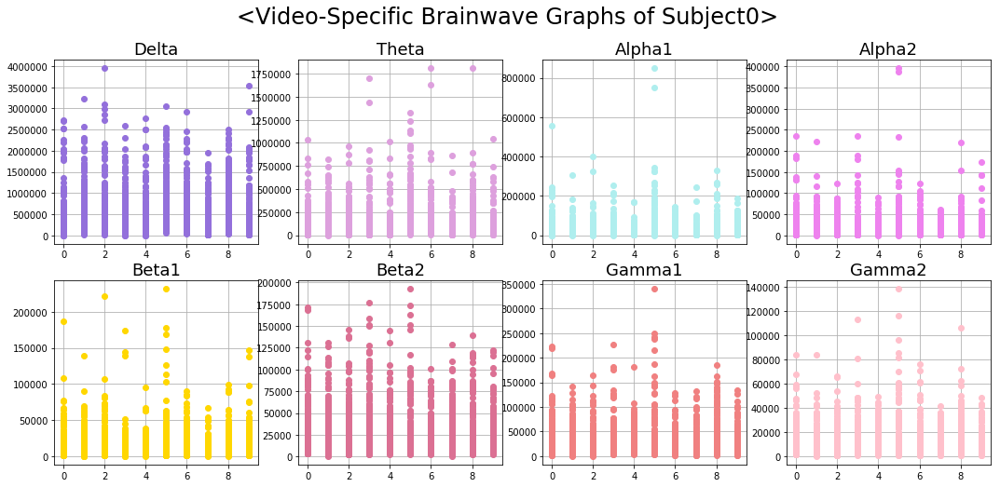

In [36]:
df_sub0_delta = df_sub0.loc[:, ['VideoID', 'Delta']]
df_sub0_theta = df_sub0.loc[:, ['VideoID', 'Theta']]
df_sub0_alpha1 = df_sub0.loc[:, ['VideoID', 'Alpha1']]
df_sub0_alpha2 = df_sub0.loc[:, ['VideoID', 'Alpha2']]
df_sub0_beta1 = df_sub0.loc[:, ['VideoID', 'Beta1']]
df_sub0_beta2 = df_sub0.loc[:, ['VideoID', 'Beta2']]
df_sub0_gamma1 = df_sub0.loc[:, ['VideoID', 'Gamma1']]
df_sub0_gamma2 = df_sub0.loc[:, ['VideoID', 'Gamma2']]

plt.figure(figsize=(18, 8)).suptitle("<Video-Specific Brainwave Graphs of Subject0>",fontsize=24)


plt.subplot(241)
x = df_sub0_delta['VideoID']
y1 = df_sub0_delta['Delta']
plt.plot(x,y1, color = 'mediumpurple', marker = 'o', linestyle = 'None')
plt.title('Delta', fontsize=18)
plt.grid()

plt.subplot(242)
x = df_sub0_theta['VideoID']
y2 = df_sub0_theta['Theta']
plt.plot(x,y2, color = 'plum', marker = 'o', linestyle = 'None')
plt.title('Theta', fontsize=18)
plt.grid()

plt.subplot(243)
x = df_sub0_alpha1['VideoID']
y3 = df_sub0_alpha1['Alpha1']
plt.plot(x,y3, color = 'paleturquoise', marker = 'o', linestyle = 'None')
plt.title('Alpha1', fontsize=18)
plt.grid()

plt.subplot(244)
x = df_sub0_alpha2['VideoID']
y4 = df_sub0_alpha2['Alpha2']
plt.plot(x,y4, color = 'violet', marker = 'o', linestyle = 'None')
plt.title('Alpha2', fontsize=18)
plt.grid()

plt.subplot(245)
x = df_sub0_beta1['VideoID']
y5 = df_sub0_beta1['Beta1']
plt.plot(x,y5, color = 'gold', marker = 'o', linestyle = 'None')
plt.title('Beta1', fontsize=18)
plt.grid()

plt.subplot(246)
x = df_sub0_beta2['VideoID']
y6 = df_sub0_beta2['Beta2']
plt.plot(x,y6, color = 'palevioletred', marker = 'o', linestyle = 'None')
plt.title('Beta2', fontsize=18)
plt.grid()

plt.subplot(247)
x = df_sub0_gamma1['VideoID']
y7 = df_sub0_gamma1['Gamma1']
plt.plot(x,y7, color = 'lightcoral', marker = 'o', linestyle = 'None')
plt.title('Gamma1', fontsize=18)
plt.grid()

plt.subplot(248)
x = df_sub0_gamma2['VideoID']
y8 = df_sub0_gamma2['Gamma2']
plt.plot(x,y8, color = 'pink', marker = 'o', linestyle = 'None')
plt.title('Gamma2', fontsize=18)
plt.grid()

### 1번째 subject의 파장별 subplot 그리기

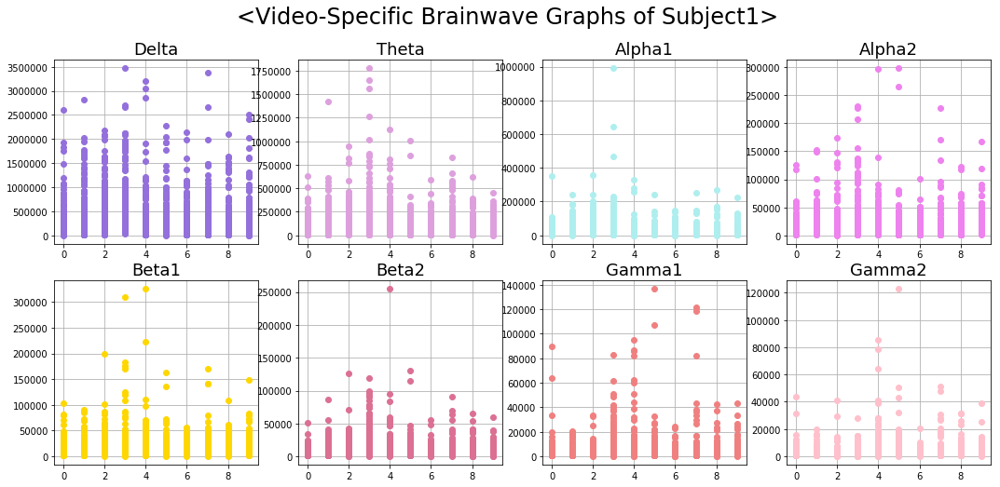

In [37]:
df_sub1_delta = df_sub1.loc[:, ['VideoID', 'Delta']]
df_sub1_theta = df_sub1.loc[:, ['VideoID', 'Theta']]
df_sub1_alpha1 = df_sub1.loc[:, ['VideoID', 'Alpha1']]
df_sub1_alpha2 = df_sub1.loc[:, ['VideoID', 'Alpha2']]
df_sub1_beta1 = df_sub1.loc[:, ['VideoID', 'Beta1']]
df_sub1_beta2 = df_sub1.loc[:, ['VideoID', 'Beta2']]
df_sub1_gamma1 = df_sub1.loc[:, ['VideoID', 'Gamma1']]
df_sub1_gamma2 = df_sub1.loc[:, ['VideoID', 'Gamma2']]

plt.figure(figsize=(18, 8)).suptitle("<Video-Specific Brainwave Graphs of Subject1>",fontsize=24)


plt.subplot(241)
x = df_sub1_delta['VideoID']
y1 = df_sub1_delta['Delta']
plt.plot(x,y1, color = 'mediumpurple', marker = 'o', linestyle = 'None')
plt.title('Delta', fontsize=18)
plt.grid()

plt.subplot(242)
x = df_sub1_theta['VideoID']
y2 = df_sub1_theta['Theta']
plt.plot(x,y2, color = 'plum', marker = 'o', linestyle = 'None')
plt.title('Theta', fontsize=18)
plt.grid()

plt.subplot(243)
x = df_sub1_alpha1['VideoID']
y3 = df_sub1_alpha1['Alpha1']
plt.plot(x,y3, color = 'paleturquoise', marker = 'o', linestyle = 'None')
plt.title('Alpha1', fontsize=18)
plt.grid()

plt.subplot(244)
x = df_sub1_alpha2['VideoID']
y4 = df_sub1_alpha2['Alpha2']
plt.plot(x,y4, color = 'violet', marker = 'o', linestyle = 'None')
plt.title('Alpha2', fontsize=18)
plt.grid()

plt.subplot(245)
x = df_sub1_beta1['VideoID']
y5 = df_sub1_beta1['Beta1']
plt.plot(x,y5, color = 'gold', marker = 'o', linestyle = 'None')
plt.title('Beta1', fontsize=18)
plt.grid()

plt.subplot(246)
x = df_sub1_beta2['VideoID']
y6 = df_sub1_beta2['Beta2']
plt.plot(x,y6, color = 'palevioletred', marker = 'o', linestyle = 'None')
plt.title('Beta2', fontsize=18)
plt.grid()

plt.subplot(247)
x = df_sub1_gamma1['VideoID']
y7 = df_sub1_gamma1['Gamma1']
plt.plot(x,y7, color = 'lightcoral', marker = 'o', linestyle = 'None')
plt.title('Gamma1', fontsize=18)
plt.grid()

plt.subplot(248)
x = df_sub1_gamma2['VideoID']
y8 = df_sub1_gamma2['Gamma2']
plt.plot(x,y8, color = 'pink', marker = 'o', linestyle = 'None')
plt.title('Gamma2', fontsize=18)
plt.grid()

### 2번째 subject의 파장별 subplot 그리기

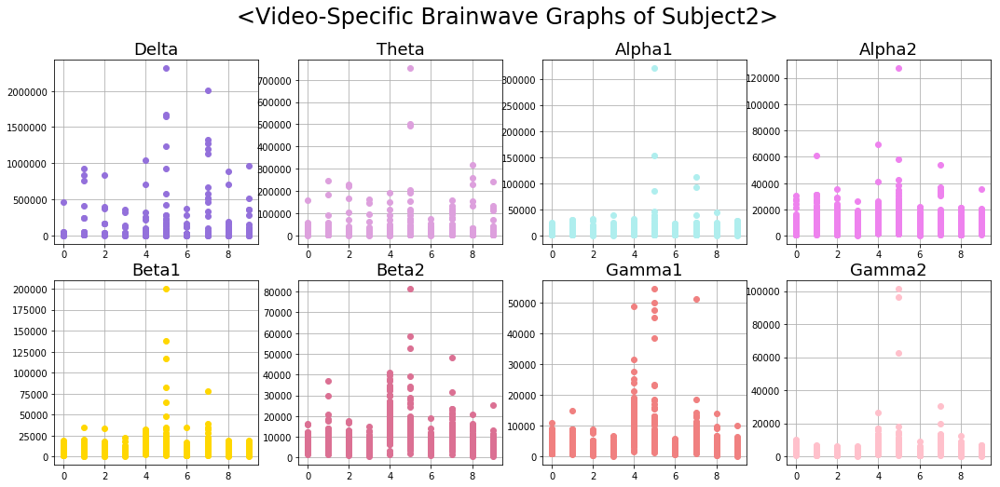

In [38]:
df_sub2_delta = df_sub2.loc[:, ['VideoID', 'Delta']]
df_sub2_theta = df_sub2.loc[:, ['VideoID', 'Theta']]
df_sub2_alpha1 = df_sub2.loc[:, ['VideoID', 'Alpha1']]
df_sub2_alpha2 = df_sub2.loc[:, ['VideoID', 'Alpha2']]
df_sub2_beta1 = df_sub2.loc[:, ['VideoID', 'Beta1']]
df_sub2_beta2 = df_sub2.loc[:, ['VideoID', 'Beta2']]
df_sub2_gamma1 = df_sub2.loc[:, ['VideoID', 'Gamma1']]
df_sub2_gamma2 = df_sub2.loc[:, ['VideoID', 'Gamma2']]

plt.figure(figsize=(18, 8)).suptitle("<Video-Specific Brainwave Graphs of Subject2>",fontsize=24)


plt.subplot(241)
x = df_sub2_delta['VideoID']
y1 = df_sub2_delta['Delta']
plt.plot(x,y1, color = 'mediumpurple', marker = 'o', linestyle = 'None')
plt.title('Delta', fontsize=18)
plt.grid()

plt.subplot(242)
x = df_sub2_theta['VideoID']
y2 = df_sub2_theta['Theta']
plt.plot(x,y2, color = 'plum', marker = 'o', linestyle = 'None')
plt.title('Theta', fontsize=18)
plt.grid()

plt.subplot(243)
x = df_sub2_alpha1['VideoID']
y3 = df_sub2_alpha1['Alpha1']
plt.plot(x,y3, color = 'paleturquoise', marker = 'o', linestyle = 'None')
plt.title('Alpha1', fontsize=18)
plt.grid()

plt.subplot(244)
x = df_sub2_alpha2['VideoID']
y4 = df_sub2_alpha2['Alpha2']
plt.plot(x,y4, color = 'violet', marker = 'o', linestyle = 'None')
plt.title('Alpha2', fontsize=18)
plt.grid()

plt.subplot(245)
x = df_sub2_beta1['VideoID']
y5 = df_sub2_beta1['Beta1']
plt.plot(x,y5, color = 'gold', marker = 'o', linestyle = 'None')
plt.title('Beta1', fontsize=18)
plt.grid()

plt.subplot(246)
x = df_sub2_beta2['VideoID']
y6 = df_sub2_beta2['Beta2']
plt.plot(x,y6, color = 'palevioletred', marker = 'o', linestyle = 'None')
plt.title('Beta2', fontsize=18)
plt.grid()

plt.subplot(247)
x = df_sub2_gamma1['VideoID']
y7 = df_sub2_gamma1['Gamma1']
plt.plot(x,y7, color = 'lightcoral', marker = 'o', linestyle = 'None')
plt.title('Gamma1', fontsize=18)
plt.grid()

plt.subplot(248)
x = df_sub2_gamma2['VideoID']
y8 = df_sub2_gamma2['Gamma2']
plt.plot(x,y8, color = 'pink', marker = 'o', linestyle = 'None')
plt.title('Gamma2', fontsize=18)
plt.grid()

### 3번째 subject의 파장별 subplot 그리기

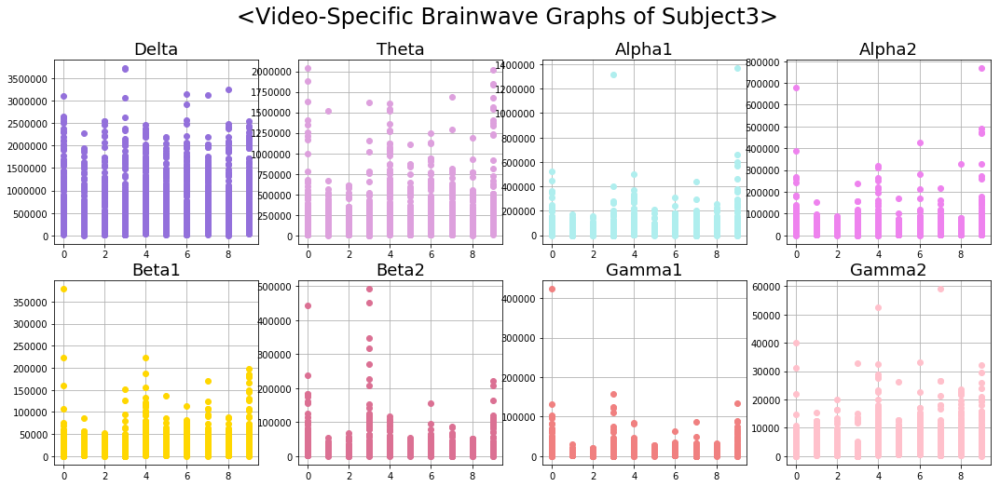

In [39]:
df_sub3_delta = df_sub3.loc[:, ['VideoID', 'Delta']]
df_sub3_theta = df_sub3.loc[:, ['VideoID', 'Theta']]
df_sub3_alpha1 = df_sub3.loc[:, ['VideoID', 'Alpha1']]
df_sub3_alpha2 = df_sub3.loc[:, ['VideoID', 'Alpha2']]
df_sub3_beta1 = df_sub3.loc[:, ['VideoID', 'Beta1']]
df_sub3_beta2 = df_sub3.loc[:, ['VideoID', 'Beta2']]
df_sub3_gamma1 = df_sub3.loc[:, ['VideoID', 'Gamma1']]
df_sub3_gamma2 = df_sub3.loc[:, ['VideoID', 'Gamma2']]

plt.figure(figsize=(18, 8)).suptitle("<Video-Specific Brainwave Graphs of Subject3>",fontsize=24)


plt.subplot(241)
x = df_sub3_delta['VideoID']
y1 = df_sub3_delta['Delta']
plt.plot(x,y1, color = 'mediumpurple', marker = 'o', linestyle = 'None')
plt.title('Delta', fontsize=18)
plt.grid()

plt.subplot(242)
x = df_sub3_theta['VideoID']
y2 = df_sub3_theta['Theta']
plt.plot(x,y2, color = 'plum', marker = 'o', linestyle = 'None')
plt.title('Theta', fontsize=18)
plt.grid()

plt.subplot(243)
x = df_sub3_alpha1['VideoID']
y3 = df_sub3_alpha1['Alpha1']
plt.plot(x,y3, color = 'paleturquoise', marker = 'o', linestyle = 'None')
plt.title('Alpha1', fontsize=18)
plt.grid()

plt.subplot(244)
x = df_sub3_alpha2['VideoID']
y4 = df_sub3_alpha2['Alpha2']
plt.plot(x,y4, color = 'violet', marker = 'o', linestyle = 'None')
plt.title('Alpha2', fontsize=18)
plt.grid()

plt.subplot(245)
x = df_sub3_beta1['VideoID']
y5 = df_sub3_beta1['Beta1']
plt.plot(x,y5, color = 'gold', marker = 'o', linestyle = 'None')
plt.title('Beta1', fontsize=18)
plt.grid()

plt.subplot(246)
x = df_sub3_beta2['VideoID']
y6 = df_sub3_beta2['Beta2']
plt.plot(x,y6, color = 'palevioletred', marker = 'o', linestyle = 'None')
plt.title('Beta2', fontsize=18)
plt.grid()

plt.subplot(247)
x = df_sub3_gamma1['VideoID']
y7 = df_sub3_gamma1['Gamma1']
plt.plot(x,y7, color = 'lightcoral', marker = 'o', linestyle = 'None')
plt.title('Gamma1', fontsize=18)
plt.grid()

plt.subplot(248)
x = df_sub3_gamma2['VideoID']
y8 = df_sub3_gamma2['Gamma2']
plt.plot(x,y8, color = 'pink', marker = 'o', linestyle = 'None')
plt.title('Gamma2', fontsize=18)
plt.grid()

### 4번째 subject의 파장별 subplot 그리기

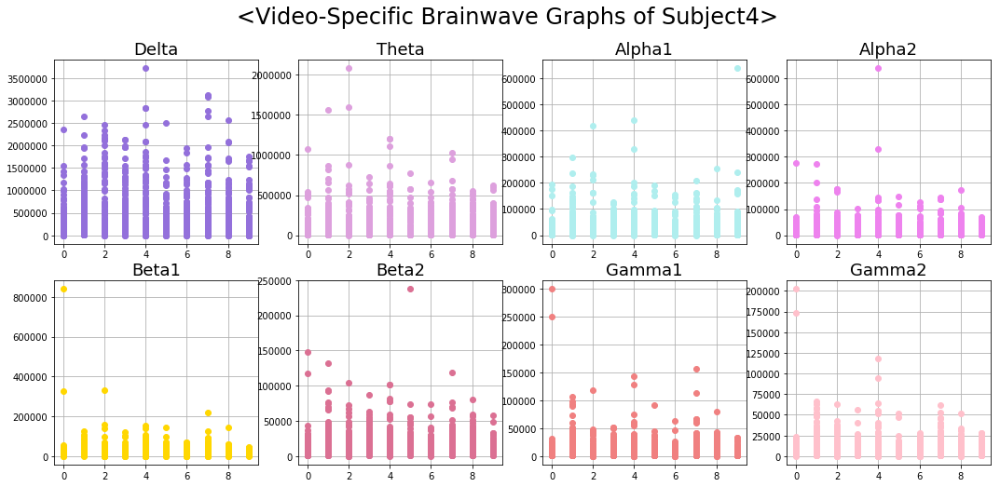

In [40]:
df_sub4_delta = df_sub4.loc[:, ['VideoID', 'Delta']]
df_sub4_theta = df_sub4.loc[:, ['VideoID', 'Theta']]
df_sub4_alpha1 = df_sub4.loc[:, ['VideoID', 'Alpha1']]
df_sub4_alpha2 = df_sub4.loc[:, ['VideoID', 'Alpha2']]
df_sub4_beta1 = df_sub4.loc[:, ['VideoID', 'Beta1']]
df_sub4_beta2 = df_sub4.loc[:, ['VideoID', 'Beta2']]
df_sub4_gamma1 = df_sub4.loc[:, ['VideoID', 'Gamma1']]
df_sub4_gamma2 = df_sub4.loc[:, ['VideoID', 'Gamma2']]

plt.figure(figsize=(18, 8)).suptitle("<Video-Specific Brainwave Graphs of Subject4>",fontsize=24)


plt.subplot(241)
x = df_sub4_delta['VideoID']
y1 = df_sub4_delta['Delta']
plt.plot(x,y1, color = 'mediumpurple', marker = 'o', linestyle = 'None')
plt.title('Delta', fontsize=18)
plt.grid()

plt.subplot(242)
x = df_sub4_theta['VideoID']
y2 = df_sub4_theta['Theta']
plt.plot(x,y2, color = 'plum', marker = 'o', linestyle = 'None')
plt.title('Theta', fontsize=18)
plt.grid()

plt.subplot(243)
x = df_sub4_alpha1['VideoID']
y3 = df_sub4_alpha1['Alpha1']
plt.plot(x,y3, color = 'paleturquoise', marker = 'o', linestyle = 'None')
plt.title('Alpha1', fontsize=18)
plt.grid()

plt.subplot(244)
x = df_sub4_alpha2['VideoID']
y4 = df_sub4_alpha2['Alpha2']
plt.plot(x,y4, color = 'violet', marker = 'o', linestyle = 'None')
plt.title('Alpha2', fontsize=18)
plt.grid()

plt.subplot(245)
x = df_sub4_beta1['VideoID']
y5 = df_sub4_beta1['Beta1']
plt.plot(x,y5, color = 'gold', marker = 'o', linestyle = 'None')
plt.title('Beta1', fontsize=18)
plt.grid()

plt.subplot(246)
x = df_sub4_beta2['VideoID']
y6 = df_sub4_beta2['Beta2']
plt.plot(x,y6, color = 'palevioletred', marker = 'o', linestyle = 'None')
plt.title('Beta2', fontsize=18)
plt.grid()

plt.subplot(247)
x = df_sub4_gamma1['VideoID']
y7 = df_sub4_gamma1['Gamma1']
plt.plot(x,y7, color = 'lightcoral', marker = 'o', linestyle = 'None')
plt.title('Gamma1', fontsize=18)
plt.grid()

plt.subplot(248)
x = df_sub4_gamma2['VideoID']
y8 = df_sub4_gamma2['Gamma2']
plt.plot(x,y8, color = 'pink', marker = 'o', linestyle = 'None')
plt.title('Gamma2', fontsize=18)
plt.grid()

### 5번째 subject의 파장별 subplot 그리기

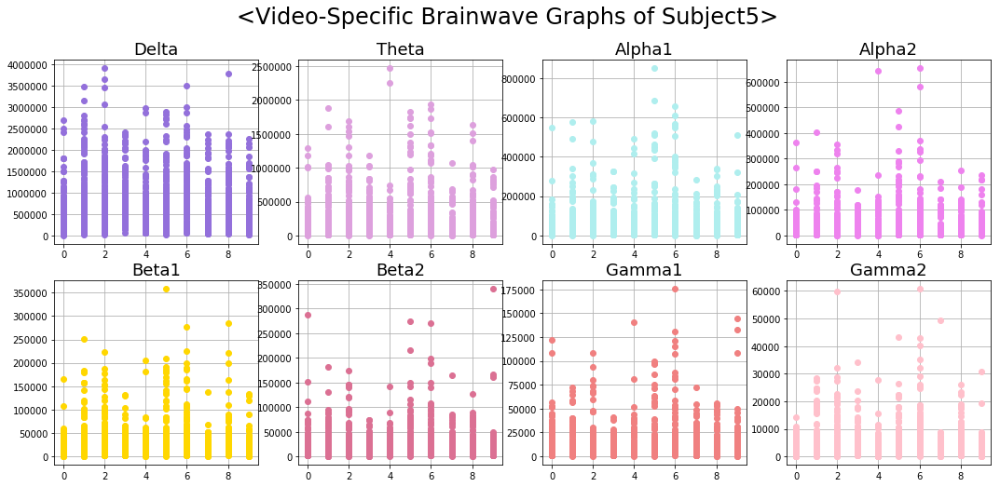

In [41]:
df_sub5_delta = df_sub5.loc[:, ['VideoID', 'Delta']]
df_sub5_theta = df_sub5.loc[:, ['VideoID', 'Theta']]
df_sub5_alpha1 = df_sub5.loc[:, ['VideoID', 'Alpha1']]
df_sub5_alpha2 = df_sub5.loc[:, ['VideoID', 'Alpha2']]
df_sub5_beta1 = df_sub5.loc[:, ['VideoID', 'Beta1']]
df_sub5_beta2 = df_sub5.loc[:, ['VideoID', 'Beta2']]
df_sub5_gamma1 = df_sub5.loc[:, ['VideoID', 'Gamma1']]
df_sub5_gamma2 = df_sub5.loc[:, ['VideoID', 'Gamma2']]

plt.figure(figsize=(18, 8)).suptitle("<Video-Specific Brainwave Graphs of Subject5>",fontsize=24)


plt.subplot(241)
x = df_sub5_delta['VideoID']
y1 = df_sub5_delta['Delta']
plt.plot(x,y1, color = 'mediumpurple', marker = 'o', linestyle = 'None')
plt.title('Delta', fontsize=18)
plt.grid()

plt.subplot(242)
x = df_sub5_theta['VideoID']
y2 = df_sub5_theta['Theta']
plt.plot(x,y2, color = 'plum', marker = 'o', linestyle = 'None')
plt.title('Theta', fontsize=18)
plt.grid()

plt.subplot(243)
x = df_sub5_alpha1['VideoID']
y3 = df_sub5_alpha1['Alpha1']
plt.plot(x,y3, color = 'paleturquoise', marker = 'o', linestyle = 'None')
plt.title('Alpha1', fontsize=18)
plt.grid()

plt.subplot(244)
x = df_sub5_alpha2['VideoID']
y4 = df_sub5_alpha2['Alpha2']
plt.plot(x,y4, color = 'violet', marker = 'o', linestyle = 'None')
plt.title('Alpha2', fontsize=18)
plt.grid()

plt.subplot(245)
x = df_sub5_beta1['VideoID']
y5 = df_sub5_beta1['Beta1']
plt.plot(x,y5, color = 'gold', marker = 'o', linestyle = 'None')
plt.title('Beta1', fontsize=18)
plt.grid()

plt.subplot(246)
x = df_sub5_beta2['VideoID']
y6 = df_sub5_beta2['Beta2']
plt.plot(x,y6, color = 'palevioletred', marker = 'o', linestyle = 'None')
plt.title('Beta2', fontsize=18)
plt.grid()

plt.subplot(247)
x = df_sub5_gamma1['VideoID']
y7 = df_sub5_gamma1['Gamma1']
plt.plot(x,y7, color = 'lightcoral', marker = 'o', linestyle = 'None')
plt.title('Gamma1', fontsize=18)
plt.grid()

plt.subplot(248)
x = df_sub5_gamma2['VideoID']
y8 = df_sub5_gamma2['Gamma2']
plt.plot(x,y8, color = 'pink', marker = 'o', linestyle = 'None')
plt.title('Gamma2', fontsize=18)
plt.grid()

### 6번째 subject의 파장별 subplot 그리기

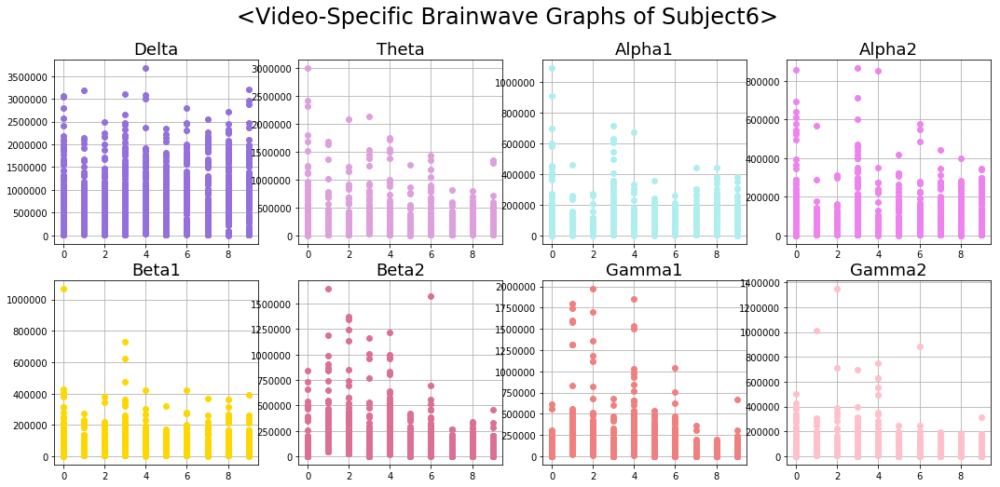

In [42]:
df_sub6_delta = df_sub6.loc[:, ['VideoID', 'Delta']]
df_sub6_theta = df_sub6.loc[:, ['VideoID', 'Theta']]
df_sub6_alpha1 = df_sub6.loc[:, ['VideoID', 'Alpha1']]
df_sub6_alpha2 = df_sub6.loc[:, ['VideoID', 'Alpha2']]
df_sub6_beta1 = df_sub6.loc[:, ['VideoID', 'Beta1']]
df_sub6_beta2 = df_sub6.loc[:, ['VideoID', 'Beta2']]
df_sub6_gamma1 = df_sub6.loc[:, ['VideoID', 'Gamma1']]
df_sub6_gamma2 = df_sub6.loc[:, ['VideoID', 'Gamma2']]

plt.figure(figsize=(18, 8)).suptitle("<Video-Specific Brainwave Graphs of Subject6>",fontsize=24)


plt.subplot(241)
x = df_sub6_delta['VideoID']
y1 = df_sub6_delta['Delta']
plt.plot(x,y1, color = 'mediumpurple', marker = 'o', linestyle = 'None')
plt.title('Delta', fontsize=18)
plt.grid()

plt.subplot(242)
x = df_sub6_theta['VideoID']
y2 = df_sub6_theta['Theta']
plt.plot(x,y2, color = 'plum', marker = 'o', linestyle = 'None')
plt.title('Theta', fontsize=18)
plt.grid()

plt.subplot(243)
x = df_sub6_alpha1['VideoID']
y3 = df_sub6_alpha1['Alpha1']
plt.plot(x,y3, color = 'paleturquoise', marker = 'o', linestyle = 'None')
plt.title('Alpha1', fontsize=18)
plt.grid()

plt.subplot(244)
x = df_sub6_alpha2['VideoID']
y4 = df_sub6_alpha2['Alpha2']
plt.plot(x,y4, color = 'violet', marker = 'o', linestyle = 'None')
plt.title('Alpha2', fontsize=18)
plt.grid()

plt.subplot(245)
x = df_sub6_beta1['VideoID']
y5 = df_sub6_beta1['Beta1']
plt.plot(x,y5, color = 'gold', marker = 'o', linestyle = 'None')
plt.title('Beta1', fontsize=18)
plt.grid()

plt.subplot(246)
x = df_sub6_beta2['VideoID']
y6 = df_sub6_beta2['Beta2']
plt.plot(x,y6, color = 'palevioletred', marker = 'o', linestyle = 'None')
plt.title('Beta2', fontsize=18)
plt.grid()

plt.subplot(247)
x = df_sub6_gamma1['VideoID']
y7 = df_sub6_gamma1['Gamma1']
plt.plot(x,y7, color = 'lightcoral', marker = 'o', linestyle = 'None')
plt.title('Gamma1', fontsize=18)
plt.grid()

plt.subplot(248)
x = df_sub6_gamma2['VideoID']
y8 = df_sub6_gamma2['Gamma2']
plt.plot(x,y8, color = 'pink', marker = 'o', linestyle = 'None')
plt.title('Gamma2', fontsize=18)
plt.grid()

### 7번째 subject의 파장별 subplot 그리기

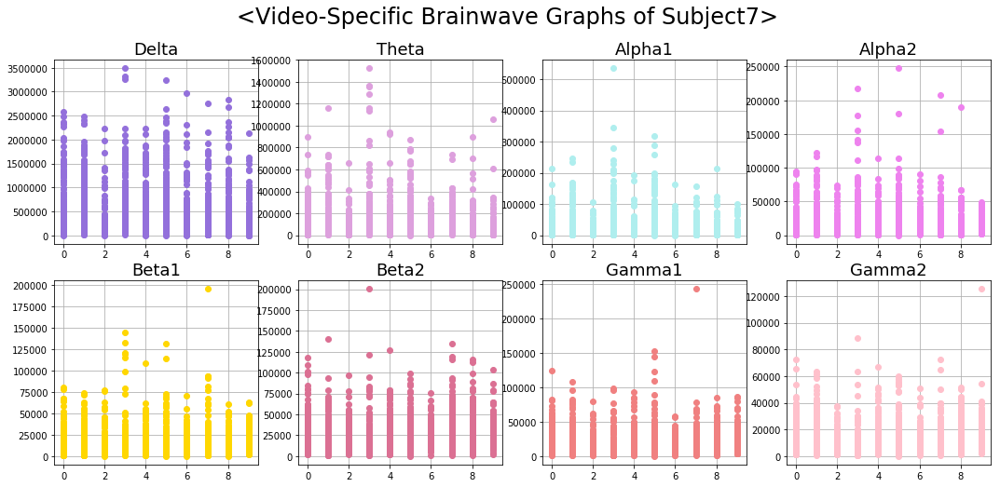

In [44]:
df_sub7_delta = df_sub7.loc[:, ['VideoID', 'Delta']]
df_sub7_theta = df_sub7.loc[:, ['VideoID', 'Theta']]
df_sub7_alpha1 = df_sub7.loc[:, ['VideoID', 'Alpha1']]
df_sub7_alpha2 = df_sub7.loc[:, ['VideoID', 'Alpha2']]
df_sub7_beta1 = df_sub7.loc[:, ['VideoID', 'Beta1']]
df_sub7_beta2 = df_sub7.loc[:, ['VideoID', 'Beta2']]
df_sub7_gamma1 = df_sub7.loc[:, ['VideoID', 'Gamma1']]
df_sub7_gamma2 = df_sub7.loc[:, ['VideoID', 'Gamma2']]

plt.figure(figsize=(18, 8)).suptitle("<Video-Specific Brainwave Graphs of Subject7>",fontsize=24)


plt.subplot(241)
x = df_sub7_delta['VideoID']
y1 = df_sub7_delta['Delta']
plt.plot(x,y1, color = 'mediumpurple', marker = 'o', linestyle = 'None')
plt.title('Delta', fontsize=18)
plt.grid()

plt.subplot(242)
x = df_sub7_theta['VideoID']
y2 = df_sub7_theta['Theta']
plt.plot(x,y2, color = 'plum', marker = 'o', linestyle = 'None')
plt.title('Theta', fontsize=18)
plt.grid()

plt.subplot(243)
x = df_sub7_alpha1['VideoID']
y3 = df_sub7_alpha1['Alpha1']
plt.plot(x,y3, color = 'paleturquoise', marker = 'o', linestyle = 'None')
plt.title('Alpha1', fontsize=18)
plt.grid()

plt.subplot(244)
x = df_sub7_alpha2['VideoID']
y4 = df_sub7_alpha2['Alpha2']
plt.plot(x,y4, color = 'violet', marker = 'o', linestyle = 'None')
plt.title('Alpha2', fontsize=18)
plt.grid()

plt.subplot(245)
x = df_sub7_beta1['VideoID']
y5 = df_sub7_beta1['Beta1']
plt.plot(x,y5, color = 'gold', marker = 'o', linestyle = 'None')
plt.title('Beta1', fontsize=18)
plt.grid()

plt.subplot(246)
x = df_sub7_beta2['VideoID']
y6 = df_sub7_beta2['Beta2']
plt.plot(x,y6, color = 'palevioletred', marker = 'o', linestyle = 'None')
plt.title('Beta2', fontsize=18)
plt.grid()

plt.subplot(247)
x = df_sub7_gamma1['VideoID']
y7 = df_sub7_gamma1['Gamma1']
plt.plot(x,y7, color = 'lightcoral', marker = 'o', linestyle = 'None')
plt.title('Gamma1', fontsize=18)
plt.grid()

plt.subplot(248)
x = df_sub7_gamma2['VideoID']
y8 = df_sub7_gamma2['Gamma2']
plt.plot(x,y8, color = 'pink', marker = 'o', linestyle = 'None')
plt.title('Gamma2', fontsize=18)
plt.grid()

### 8번째 subject의 파장별 subplot 그리기

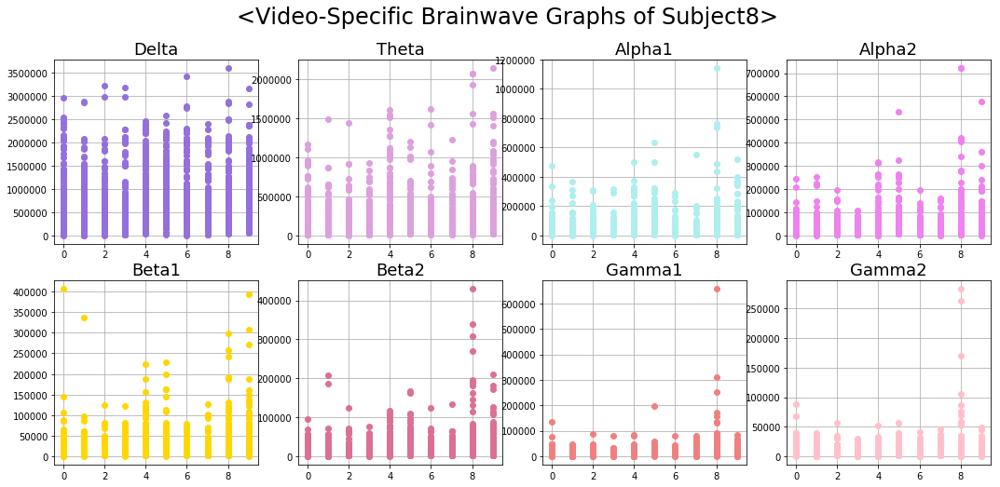

In [45]:
df_sub8_delta = df_sub8.loc[:, ['VideoID', 'Delta']]
df_sub8_theta = df_sub8.loc[:, ['VideoID', 'Theta']]
df_sub8_alpha1 = df_sub8.loc[:, ['VideoID', 'Alpha1']]
df_sub8_alpha2 = df_sub8.loc[:, ['VideoID', 'Alpha2']]
df_sub8_beta1 = df_sub8.loc[:, ['VideoID', 'Beta1']]
df_sub8_beta2 = df_sub8.loc[:, ['VideoID', 'Beta2']]
df_sub8_gamma1 = df_sub8.loc[:, ['VideoID', 'Gamma1']]
df_sub8_gamma2 = df_sub8.loc[:, ['VideoID', 'Gamma2']]

plt.figure(figsize=(18, 8)).suptitle("<Video-Specific Brainwave Graphs of Subject8>",fontsize=24)


plt.subplot(241)
x = df_sub8_delta['VideoID']
y1 = df_sub8_delta['Delta']
plt.plot(x,y1, color = 'mediumpurple', marker = 'o', linestyle = 'None')
plt.title('Delta', fontsize=18)
plt.grid()

plt.subplot(242)
x = df_sub8_theta['VideoID']
y2 = df_sub8_theta['Theta']
plt.plot(x,y2, color = 'plum', marker = 'o', linestyle = 'None')
plt.title('Theta', fontsize=18)
plt.grid()

plt.subplot(243)
x = df_sub8_alpha1['VideoID']
y3 = df_sub8_alpha1['Alpha1']
plt.plot(x,y3, color = 'paleturquoise', marker = 'o', linestyle = 'None')
plt.title('Alpha1', fontsize=18)
plt.grid()

plt.subplot(244)
x = df_sub8_alpha2['VideoID']
y4 = df_sub8_alpha2['Alpha2']
plt.plot(x,y4, color = 'violet', marker = 'o', linestyle = 'None')
plt.title('Alpha2', fontsize=18)
plt.grid()

plt.subplot(245)
x = df_sub8_beta1['VideoID']
y5 = df_sub8_beta1['Beta1']
plt.plot(x,y5, color = 'gold', marker = 'o', linestyle = 'None')
plt.title('Beta1', fontsize=18)
plt.grid()

plt.subplot(246)
x = df_sub8_beta2['VideoID']
y6 = df_sub8_beta2['Beta2']
plt.plot(x,y6, color = 'palevioletred', marker = 'o', linestyle = 'None')
plt.title('Beta2', fontsize=18)
plt.grid()

plt.subplot(247)
x = df_sub8_gamma1['VideoID']
y7 = df_sub8_gamma1['Gamma1']
plt.plot(x,y7, color = 'lightcoral', marker = 'o', linestyle = 'None')
plt.title('Gamma1', fontsize=18)
plt.grid()

plt.subplot(248)
x = df_sub8_gamma2['VideoID']
y8 = df_sub8_gamma2['Gamma2']
plt.plot(x,y8, color = 'pink', marker = 'o', linestyle = 'None')
plt.title('Gamma2', fontsize=18)
plt.grid()

### 9번째 subject의 파장별 subplot 그리기

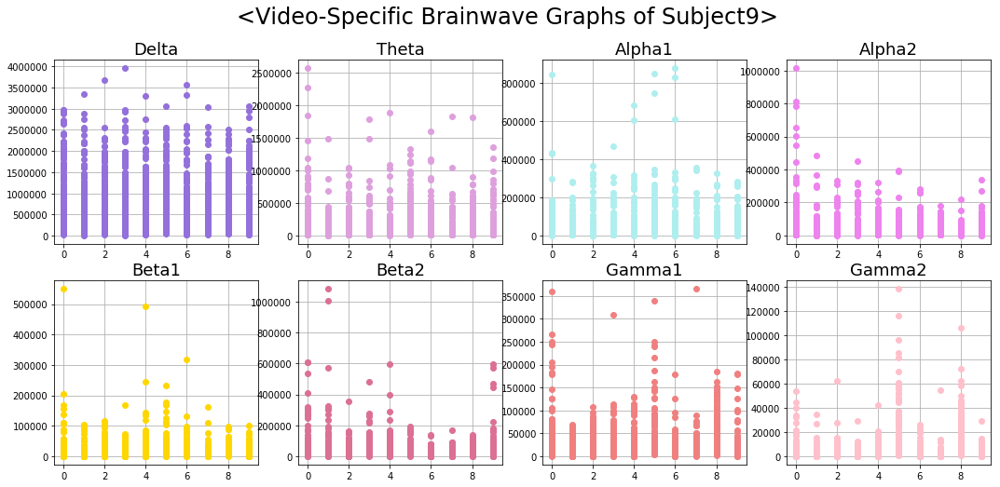

In [46]:
df_sub9_delta = df_sub9.loc[:, ['VideoID', 'Delta']]
df_sub9_theta = df_sub9.loc[:, ['VideoID', 'Theta']]
df_sub9_alpha1 = df_sub9.loc[:, ['VideoID', 'Alpha1']]
df_sub9_alpha2 = df_sub9.loc[:, ['VideoID', 'Alpha2']]
df_sub9_beta1 = df_sub9.loc[:, ['VideoID', 'Beta1']]
df_sub9_beta2 = df_sub9.loc[:, ['VideoID', 'Beta2']]
df_sub9_gamma1 = df_sub9.loc[:, ['VideoID', 'Gamma1']]
df_sub9_gamma2 = df_sub9.loc[:, ['VideoID', 'Gamma2']]

plt.figure(figsize=(18, 8)).suptitle("<Video-Specific Brainwave Graphs of Subject9>",fontsize=24)


plt.subplot(241)
x = df_sub9_delta['VideoID']
y1 = df_sub9_delta['Delta']
plt.plot(x,y1, color = 'mediumpurple', marker = 'o', linestyle = 'None')
plt.title('Delta', fontsize=18)
plt.grid()

plt.subplot(242)
x = df_sub9_theta['VideoID']
y2 = df_sub9_theta['Theta']
plt.plot(x,y2, color = 'plum', marker = 'o', linestyle = 'None')
plt.title('Theta', fontsize=18)
plt.grid()

plt.subplot(243)
x = df_sub9_alpha1['VideoID']
y3 = df_sub9_alpha1['Alpha1']
plt.plot(x,y3, color = 'paleturquoise', marker = 'o', linestyle = 'None')
plt.title('Alpha1', fontsize=18)
plt.grid()

plt.subplot(244)
x = df_sub9_alpha2['VideoID']
y4 = df_sub9_alpha2['Alpha2']
plt.plot(x,y4, color = 'violet', marker = 'o', linestyle = 'None')
plt.title('Alpha2', fontsize=18)
plt.grid()

plt.subplot(245)
x = df_sub9_beta1['VideoID']
y5 = df_sub9_beta1['Beta1']
plt.plot(x,y5, color = 'gold', marker = 'o', linestyle = 'None')
plt.title('Beta1', fontsize=18)
plt.grid()

plt.subplot(246)
x = df_sub9_beta2['VideoID']
y6 = df_sub9_beta2['Beta2']
plt.plot(x,y6, color = 'palevioletred', marker = 'o', linestyle = 'None')
plt.title('Beta2', fontsize=18)
plt.grid()

plt.subplot(247)
x = df_sub9_gamma1['VideoID']
y7 = df_sub9_gamma1['Gamma1']
plt.plot(x,y7, color = 'lightcoral', marker = 'o', linestyle = 'None')
plt.title('Gamma1', fontsize=18)
plt.grid()

plt.subplot(248)
x = df_sub9_gamma2['VideoID']
y8 = df_sub9_gamma2['Gamma2']
plt.plot(x,y8, color = 'pink', marker = 'o', linestyle = 'None')
plt.title('Gamma2', fontsize=18)
plt.grid()

### subject 들의 Video 별 Beta&Gamma 평균 그래프 그리기

In [47]:
df_sub0_0 = df_sub0.loc[df_sub0['VideoID'] == 0, 'Beta1':'Gamma2']
df_sub0_0_des = df_sub0_0.describe()
df_sub0_0_des = df_sub0_0_des.loc['mean', 'Beta1':'Gamma2']

df_sub0_1 = df_sub0.loc[df_sub0['VideoID'] == 1, 'Beta1':'Gamma2']
df_sub0_1_des = df_sub0_1.describe()
df_sub0_1_des = df_sub0_1_des.loc['mean', 'Beta1':'Gamma2']

df_sub0_2 = df_sub0.loc[df_sub0['VideoID'] == 2, 'Beta1':'Gamma2']
df_sub0_2_des = df_sub0_2.describe()
df_sub0_2_des = df_sub0_2_des.loc['mean', 'Beta1':'Gamma2']

df_sub0_3 = df_sub0.loc[df_sub0['VideoID'] == 3, 'Beta1':'Gamma2']
df_sub0_3_des = df_sub0_3.describe()
df_sub0_3_des = df_sub0_3_des.loc['mean', 'Beta1':'Gamma2']

df_sub0_4 = df_sub0.loc[df_sub0['VideoID'] == 4, 'Beta1':'Gamma2']
df_sub0_4_des = df_sub0_4.describe()
df_sub0_4_des = df_sub0_4_des.loc['mean', 'Beta1':'Gamma2']

df_sub0_5 = df_sub0.loc[df_sub0['VideoID'] == 5, 'Beta1':'Gamma2']
df_sub0_5_des = df_sub0_5.describe()
df_sub0_5_des = df_sub0_5_des.loc['mean', 'Beta1':'Gamma2']

df_sub0_6 = df_sub0.loc[df_sub0['VideoID'] == 6, 'Beta1':'Gamma2']
df_sub0_6_des = df_sub0_6.describe()
df_sub0_6_des = df_sub0_6_des.loc['mean', 'Beta1':'Gamma2']

df_sub0_7 = df_sub0.loc[df_sub0['VideoID'] == 7, 'Beta1':'Gamma2']
df_sub0_7_des = df_sub0_7.describe()
df_sub0_7_des = df_sub0_7_des.loc['mean', 'Beta1':'Gamma2']

df_sub0_8 = df_sub0.loc[df_sub0['VideoID'] == 8, 'Beta1':'Gamma2']
df_sub0_8_des = df_sub0_8.describe()
df_sub0_8_des = df_sub0_8_des.loc['mean', 'Beta1':'Gamma2']

df_sub0_9 = df_sub0.loc[df_sub0['VideoID'] == 9, 'Beta1':'Gamma2']
df_sub0_9_des = df_sub0_9.describe()
df_sub0_9_des = df_sub0_9_des.loc['mean', 'Beta1':'Gamma2']

In [48]:
df_sub1_0 = df_sub1.loc[df_sub1['VideoID'] == 0, 'Beta1':'Gamma2']
df_sub1_0_des = df_sub1_0.describe()
df_sub1_0_des = df_sub1_0_des.loc['mean', 'Beta1':'Gamma2']

df_sub1_1 = df_sub1.loc[df_sub1['VideoID'] == 1, 'Beta1':'Gamma2']
df_sub1_1_des = df_sub1_1.describe()
df_sub1_1_des = df_sub1_1_des.loc['mean', 'Beta1':'Gamma2']

df_sub1_2 = df_sub1.loc[df_sub1['VideoID'] == 2, 'Beta1':'Gamma2']
df_sub1_2_des = df_sub1_2.describe()
df_sub1_2_des = df_sub1_2_des.loc['mean', 'Beta1':'Gamma2']

df_sub1_3 = df_sub1.loc[df_sub1['VideoID'] == 3, 'Beta1':'Gamma2']
df_sub1_3_des = df_sub1_3.describe()
df_sub1_3_des = df_sub1_3_des.loc['mean', 'Beta1':'Gamma2']

df_sub1_4 = df_sub1.loc[df_sub1['VideoID'] == 4, 'Beta1':'Gamma2']
df_sub1_4_des = df_sub1_4.describe()
df_sub1_4_des = df_sub1_4_des.loc['mean', 'Beta1':'Gamma2']

df_sub1_5 = df_sub1.loc[df_sub1['VideoID'] == 5, 'Beta1':'Gamma2']
df_sub1_5_des = df_sub1_5.describe()
df_sub1_5_des = df_sub1_5_des.loc['mean', 'Beta1':'Gamma2']

df_sub1_6 = df_sub1.loc[df_sub1['VideoID'] == 6, 'Beta1':'Gamma2']
df_sub1_6_des = df_sub1_6.describe()
df_sub1_6_des = df_sub1_6_des.loc['mean', 'Beta1':'Gamma2']

df_sub1_7 = df_sub1.loc[df_sub1['VideoID'] == 7, 'Beta1':'Gamma2']
df_sub1_7_des = df_sub1_7.describe()
df_sub1_7_des = df_sub1_7_des.loc['mean', 'Beta1':'Gamma2']

df_sub1_8 = df_sub1.loc[df_sub1['VideoID'] == 8, 'Beta1':'Gamma2']
df_sub1_8_des = df_sub1_8.describe()
df_sub1_8_des = df_sub1_8_des.loc['mean', 'Beta1':'Gamma2']

df_sub1_9 = df_sub1.loc[df_sub1['VideoID'] == 9, 'Beta1':'Gamma2']
df_sub1_9_des = df_sub1_9.describe()
df_sub1_9_des = df_sub1_9_des.loc['mean', 'Beta1':'Gamma2']

In [49]:
df_sub2_0 = df_sub2.loc[df_sub2['VideoID'] == 0, 'Beta1':'Gamma2']
df_sub2_0_des = df_sub2_0.describe()
df_sub2_0_des = df_sub2_0_des.loc['mean', 'Beta1':'Gamma2']

df_sub2_1 = df_sub2.loc[df_sub2['VideoID'] == 1, 'Beta1':'Gamma2']
df_sub2_1_des = df_sub2_1.describe()
df_sub2_1_des = df_sub2_1_des.loc['mean', 'Beta1':'Gamma2']

df_sub2_2 = df_sub2.loc[df_sub2['VideoID'] == 2, 'Beta1':'Gamma2']
df_sub2_2_des = df_sub2_2.describe()
df_sub2_2_des = df_sub2_2_des.loc['mean', 'Beta1':'Gamma2']

df_sub2_3 = df_sub2.loc[df_sub2['VideoID'] == 3, 'Beta1':'Gamma2']
df_sub2_3_des = df_sub2_3.describe()
df_sub2_3_des = df_sub2_3_des.loc['mean', 'Beta1':'Gamma2']

df_sub2_4 = df_sub2.loc[df_sub2['VideoID'] == 4, 'Beta1':'Gamma2']
df_sub2_4_des = df_sub2_4.describe()
df_sub2_4_des = df_sub2_4_des.loc['mean', 'Beta1':'Gamma2']

df_sub2_5 = df_sub2.loc[df_sub2['VideoID'] == 5, 'Beta1':'Gamma2']
df_sub2_5_des = df_sub2_5.describe()
df_sub2_5_des = df_sub2_5_des.loc['mean', 'Beta1':'Gamma2']

df_sub2_6 = df_sub2.loc[df_sub2['VideoID'] == 6, 'Beta1':'Gamma2']
df_sub2_6_des = df_sub2_6.describe()
df_sub2_6_des = df_sub2_6_des.loc['mean', 'Beta1':'Gamma2']

df_sub2_7 = df_sub2.loc[df_sub2['VideoID'] == 7, 'Beta1':'Gamma2']
df_sub2_7_des = df_sub2_7.describe()
df_sub2_7_des = df_sub2_7_des.loc['mean', 'Beta1':'Gamma2']

df_sub2_8 = df_sub2.loc[df_sub2['VideoID'] == 8, 'Beta1':'Gamma2']
df_sub2_8_des = df_sub2_8.describe()
df_sub2_8_des = df_sub2_8_des.loc['mean', 'Beta1':'Gamma2']

df_sub2_9 = df_sub2.loc[df_sub2['VideoID'] == 9, 'Beta1':'Gamma2']
df_sub2_9_des = df_sub2_9.describe()
df_sub2_9_des = df_sub2_9_des.loc['mean', 'Beta1':'Gamma2']

In [50]:
df_sub3_0 = df_sub3.loc[df_sub3['VideoID'] == 0, 'Beta1':'Gamma2']
df_sub3_0_des = df_sub3_0.describe()
df_sub3_0_des = df_sub3_0_des.loc['mean', 'Beta1':'Gamma2']

df_sub3_1 = df_sub3.loc[df_sub3['VideoID'] == 1, 'Beta1':'Gamma2']
df_sub3_1_des = df_sub3_1.describe()
df_sub3_1_des = df_sub3_1_des.loc['mean', 'Beta1':'Gamma2']

df_sub3_2 = df_sub3.loc[df_sub3['VideoID'] == 2, 'Beta1':'Gamma2']
df_sub3_2_des = df_sub3_2.describe()
df_sub3_2_des = df_sub3_2_des.loc['mean', 'Beta1':'Gamma2']

df_sub3_3 = df_sub3.loc[df_sub3['VideoID'] == 3, 'Beta1':'Gamma2']
df_sub3_3_des = df_sub3_3.describe()
df_sub3_3_des = df_sub3_3_des.loc['mean', 'Beta1':'Gamma2']

df_sub3_4 = df_sub3.loc[df_sub3['VideoID'] == 4, 'Beta1':'Gamma2']
df_sub3_4_des = df_sub3_4.describe()
df_sub3_4_des = df_sub3_4_des.loc['mean', 'Beta1':'Gamma2']

df_sub3_5 = df_sub3.loc[df_sub3['VideoID'] == 5, 'Beta1':'Gamma2']
df_sub3_5_des = df_sub3_5.describe()
df_sub3_5_des = df_sub3_5_des.loc['mean', 'Beta1':'Gamma2']

df_sub3_6 = df_sub3.loc[df_sub3['VideoID'] == 6, 'Beta1':'Gamma2']
df_sub3_6_des = df_sub3_6.describe()
df_sub3_6_des = df_sub3_6_des.loc['mean', 'Beta1':'Gamma2']

df_sub3_7 = df_sub3.loc[df_sub3['VideoID'] == 7, 'Beta1':'Gamma2']
df_sub3_7_des = df_sub3_7.describe()
df_sub3_7_des = df_sub3_7_des.loc['mean', 'Beta1':'Gamma2']

df_sub3_8 = df_sub3.loc[df_sub3['VideoID'] == 8, 'Beta1':'Gamma2']
df_sub3_8_des = df_sub3_8.describe()
df_sub3_8_des = df_sub3_8_des.loc['mean', 'Beta1':'Gamma2']

df_sub3_9 = df_sub3.loc[df_sub3['VideoID'] == 9, 'Beta1':'Gamma2']
df_sub3_9_des = df_sub3_9.describe()
df_sub3_9_des = df_sub3_9_des.loc['mean', 'Beta1':'Gamma2']

In [51]:
df_sub4_0 = df_sub4.loc[df_sub4['VideoID'] == 0, 'Beta1':'Gamma2']
df_sub4_0_des = df_sub4_0.describe()
df_sub4_0_des = df_sub4_0_des.loc['mean', 'Beta1':'Gamma2']

df_sub4_1 = df_sub4.loc[df_sub4['VideoID'] == 1, 'Beta1':'Gamma2']
df_sub4_1_des = df_sub4_1.describe()
df_sub4_1_des = df_sub4_1_des.loc['mean', 'Beta1':'Gamma2']

df_sub4_2 = df_sub4.loc[df_sub4['VideoID'] == 2, 'Beta1':'Gamma2']
df_sub4_2_des = df_sub4_2.describe()
df_sub4_2_des = df_sub4_2_des.loc['mean', 'Beta1':'Gamma2']

df_sub4_3 = df_sub4.loc[df_sub4['VideoID'] == 3, 'Beta1':'Gamma2']
df_sub4_3_des = df_sub4_3.describe()
df_sub4_3_des = df_sub4_3_des.loc['mean', 'Beta1':'Gamma2']

df_sub4_4 = df_sub4.loc[df_sub4['VideoID'] == 4, 'Beta1':'Gamma2']
df_sub4_4_des = df_sub4_4.describe()
df_sub4_4_des = df_sub4_4_des.loc['mean', 'Beta1':'Gamma2']

df_sub4_5 = df_sub4.loc[df_sub4['VideoID'] == 5, 'Beta1':'Gamma2']
df_sub4_5_des = df_sub4_5.describe()
df_sub4_5_des = df_sub4_5_des.loc['mean', 'Beta1':'Gamma2']

df_sub4_6 = df_sub4.loc[df_sub4['VideoID'] == 6, 'Beta1':'Gamma2']
df_sub4_6_des = df_sub4_6.describe()
df_sub4_6_des = df_sub4_6_des.loc['mean', 'Beta1':'Gamma2']

df_sub4_7 = df_sub4.loc[df_sub4['VideoID'] == 7, 'Beta1':'Gamma2']
df_sub4_7_des = df_sub4_7.describe()
df_sub4_7_des = df_sub4_7_des.loc['mean', 'Beta1':'Gamma2']

df_sub4_8 = df_sub4.loc[df_sub4['VideoID'] == 8, 'Beta1':'Gamma2']
df_sub4_8_des = df_sub4_8.describe()
df_sub4_8_des = df_sub4_8_des.loc['mean', 'Beta1':'Gamma2']

df_sub4_9 = df_sub4.loc[df_sub4['VideoID'] == 9, 'Beta1':'Gamma2']
df_sub4_9_des = df_sub4_9.describe()
df_sub4_9_des = df_sub4_9_des.loc['mean', 'Beta1':'Gamma2']

In [52]:
df_sub5_0 = df_sub5.loc[df_sub5['VideoID'] == 0, 'Beta1':'Gamma2']
df_sub5_0_des = df_sub5_0.describe()
df_sub5_0_des = df_sub5_0_des.loc['mean', 'Beta1':'Gamma2']

df_sub5_1 = df_sub5.loc[df_sub5['VideoID'] == 1, 'Beta1':'Gamma2']
df_sub5_1_des = df_sub5_1.describe()
df_sub5_1_des = df_sub5_1_des.loc['mean', 'Beta1':'Gamma2']

df_sub5_2 = df_sub5.loc[df_sub5['VideoID'] == 2, 'Beta1':'Gamma2']
df_sub5_2_des = df_sub5_2.describe()
df_sub5_2_des = df_sub5_2_des.loc['mean', 'Beta1':'Gamma2']

df_sub5_3 = df_sub5.loc[df_sub5['VideoID'] == 3, 'Beta1':'Gamma2']
df_sub5_3_des = df_sub5_3.describe()
df_sub5_3_des = df_sub5_3_des.loc['mean', 'Beta1':'Gamma2']

df_sub5_4 = df_sub5.loc[df_sub5['VideoID'] == 4, 'Beta1':'Gamma2']
df_sub5_4_des = df_sub5_4.describe()
df_sub5_4_des = df_sub5_4_des.loc['mean', 'Beta1':'Gamma2']

df_sub5_5 = df_sub5.loc[df_sub5['VideoID'] == 5, 'Beta1':'Gamma2']
df_sub5_5_des = df_sub5_5.describe()
df_sub5_5_des = df_sub5_5_des.loc['mean', 'Beta1':'Gamma2']

df_sub5_6 = df_sub5.loc[df_sub5['VideoID'] == 6, 'Beta1':'Gamma2']
df_sub5_6_des = df_sub5_6.describe()
df_sub5_6_des = df_sub5_6_des.loc['mean', 'Beta1':'Gamma2']

df_sub5_7 = df_sub5.loc[df_sub5['VideoID'] == 7, 'Beta1':'Gamma2']
df_sub5_7_des = df_sub5_7.describe()
df_sub5_7_des = df_sub5_7_des.loc['mean', 'Beta1':'Gamma2']

df_sub5_8 = df_sub5.loc[df_sub5['VideoID'] == 8, 'Beta1':'Gamma2']
df_sub5_8_des = df_sub5_8.describe()
df_sub5_8_des = df_sub5_8_des.loc['mean', 'Beta1':'Gamma2']

df_sub5_9 = df_sub5.loc[df_sub5['VideoID'] == 9, 'Beta1':'Gamma2']
df_sub5_9_des = df_sub5_9.describe()
df_sub5_9_des = df_sub5_9_des.loc['mean', 'Beta1':'Gamma2']

In [53]:
df_sub6_0 = df_sub6.loc[df_sub6['VideoID'] == 0, 'Beta1':'Gamma2']
df_sub6_0_des = df_sub6_0.describe()
df_sub6_0_des = df_sub6_0_des.loc['mean', 'Beta1':'Gamma2']

df_sub6_1 = df_sub6.loc[df_sub6['VideoID'] == 1, 'Beta1':'Gamma2']
df_sub6_1_des = df_sub6_1.describe()
df_sub6_1_des = df_sub6_1_des.loc['mean', 'Beta1':'Gamma2']

df_sub6_2 = df_sub6.loc[df_sub6['VideoID'] == 2, 'Beta1':'Gamma2']
df_sub6_2_des = df_sub6_2.describe()
df_sub6_2_des = df_sub6_2_des.loc['mean', 'Beta1':'Gamma2']

df_sub6_3 = df_sub6.loc[df_sub6['VideoID'] == 3, 'Beta1':'Gamma2']
df_sub6_3_des = df_sub6_3.describe()
df_sub6_3_des = df_sub6_3_des.loc['mean', 'Beta1':'Gamma2']

df_sub6_4 = df_sub6.loc[df_sub6['VideoID'] == 4, 'Beta1':'Gamma2']
df_sub6_4_des = df_sub6_4.describe()
df_sub6_4_des = df_sub6_4_des.loc['mean', 'Beta1':'Gamma2']

df_sub6_5 = df_sub6.loc[df_sub6['VideoID'] == 5, 'Beta1':'Gamma2']
df_sub6_5_des = df_sub6_5.describe()
df_sub6_5_des = df_sub6_5_des.loc['mean', 'Beta1':'Gamma2']

df_sub6_6 = df_sub6.loc[df_sub6['VideoID'] == 6, 'Beta1':'Gamma2']
df_sub6_6_des = df_sub6_6.describe()
df_sub6_6_des = df_sub6_6_des.loc['mean', 'Beta1':'Gamma2']

df_sub6_7 = df_sub6.loc[df_sub6['VideoID'] == 7, 'Beta1':'Gamma2']
df_sub6_7_des = df_sub6_7.describe()
df_sub6_7_des = df_sub6_7_des.loc['mean', 'Beta1':'Gamma2']

df_sub6_8 = df_sub6.loc[df_sub6['VideoID'] == 8, 'Beta1':'Gamma2']
df_sub6_8_des = df_sub6_8.describe()
df_sub6_8_des = df_sub6_8_des.loc['mean', 'Beta1':'Gamma2']

df_sub6_9 = df_sub6.loc[df_sub6['VideoID'] == 9, 'Beta1':'Gamma2']
df_sub6_9_des = df_sub6_9.describe()
df_sub6_9_des = df_sub6_9_des.loc['mean', 'Beta1':'Gamma2']

In [54]:
df_sub7_0 = df_sub7.loc[df_sub7['VideoID'] == 0, 'Beta1':'Gamma2']
df_sub7_0_des = df_sub7_0.describe()
df_sub7_0_des = df_sub7_0_des.loc['mean', 'Beta1':'Gamma2']

df_sub7_1 = df_sub7.loc[df_sub7['VideoID'] == 1, 'Beta1':'Gamma2']
df_sub7_1_des = df_sub7_1.describe()
df_sub7_1_des = df_sub7_1_des.loc['mean', 'Beta1':'Gamma2']

df_sub7_2 = df_sub7.loc[df_sub7['VideoID'] == 2, 'Beta1':'Gamma2']
df_sub7_2_des = df_sub7_2.describe()
df_sub7_2_des = df_sub7_2_des.loc['mean', 'Beta1':'Gamma2']

df_sub7_3 = df_sub7.loc[df_sub7['VideoID'] == 3, 'Beta1':'Gamma2']
df_sub7_3_des = df_sub7_3.describe()
df_sub7_3_des = df_sub7_3_des.loc['mean', 'Beta1':'Gamma2']

df_sub7_4 = df_sub7.loc[df_sub7['VideoID'] == 4, 'Beta1':'Gamma2']
df_sub7_4_des = df_sub7_4.describe()
df_sub7_4_des = df_sub7_4_des.loc['mean', 'Beta1':'Gamma2']

df_sub7_5 = df_sub7.loc[df_sub7['VideoID'] == 5, 'Beta1':'Gamma2']
df_sub7_5_des = df_sub7_5.describe()
df_sub7_5_des = df_sub7_5_des.loc['mean', 'Beta1':'Gamma2']

df_sub7_6 = df_sub7.loc[df_sub7['VideoID'] == 6, 'Beta1':'Gamma2']
df_sub7_6_des = df_sub7_6.describe()
df_sub7_6_des = df_sub7_6_des.loc['mean', 'Beta1':'Gamma2']

df_sub7_7 = df_sub7.loc[df_sub7['VideoID'] == 7, 'Beta1':'Gamma2']
df_sub7_7_des = df_sub7_7.describe()
df_sub7_7_des = df_sub7_7_des.loc['mean', 'Beta1':'Gamma2']

df_sub7_8 = df_sub7.loc[df_sub7['VideoID'] == 8, 'Beta1':'Gamma2']
df_sub7_8_des = df_sub7_8.describe()
df_sub7_8_des = df_sub7_8_des.loc['mean', 'Beta1':'Gamma2']

df_sub7_9 = df_sub7.loc[df_sub7['VideoID'] == 9, 'Beta1':'Gamma2']
df_sub7_9_des = df_sub7_9.describe()
df_sub7_9_des = df_sub7_9_des.loc['mean', 'Beta1':'Gamma2']

In [55]:
df_sub8_0 = df_sub8.loc[df_sub8['VideoID'] == 0, 'Beta1':'Gamma2']
df_sub8_0_des = df_sub8_0.describe()
df_sub8_0_des = df_sub8_0_des.loc['mean', 'Beta1':'Gamma2']

df_sub8_1 = df_sub8.loc[df_sub8['VideoID'] == 1, 'Beta1':'Gamma2']
df_sub8_1_des = df_sub8_1.describe()
df_sub8_1_des = df_sub8_1_des.loc['mean', 'Beta1':'Gamma2']

df_sub8_2 = df_sub8.loc[df_sub8['VideoID'] == 2, 'Beta1':'Gamma2']
df_sub8_2_des = df_sub8_2.describe()
df_sub8_2_des = df_sub8_2_des.loc['mean', 'Beta1':'Gamma2']

df_sub8_3 = df_sub8.loc[df_sub8['VideoID'] == 3, 'Beta1':'Gamma2']
df_sub8_3_des = df_sub8_3.describe()
df_sub8_3_des = df_sub8_3_des.loc['mean', 'Beta1':'Gamma2']

df_sub8_4 = df_sub8.loc[df_sub8['VideoID'] == 4, 'Beta1':'Gamma2']
df_sub8_4_des = df_sub8_4.describe()
df_sub8_4_des = df_sub8_4_des.loc['mean', 'Beta1':'Gamma2']

df_sub8_5 = df_sub8.loc[df_sub8['VideoID'] == 5, 'Beta1':'Gamma2']
df_sub8_5_des = df_sub8_5.describe()
df_sub8_5_des = df_sub8_5_des.loc['mean', 'Beta1':'Gamma2']

df_sub8_6 = df_sub8.loc[df_sub8['VideoID'] == 6, 'Beta1':'Gamma2']
df_sub8_6_des = df_sub8_6.describe()
df_sub8_6_des = df_sub8_6_des.loc['mean', 'Beta1':'Gamma2']

df_sub8_7 = df_sub8.loc[df_sub8['VideoID'] == 7, 'Beta1':'Gamma2']
df_sub8_7_des = df_sub8_7.describe()
df_sub8_7_des = df_sub8_7_des.loc['mean', 'Beta1':'Gamma2']

df_sub8_8 = df_sub8.loc[df_sub8['VideoID'] == 8, 'Beta1':'Gamma2']
df_sub8_8_des = df_sub8_8.describe()
df_sub8_8_des = df_sub8_8_des.loc['mean', 'Beta1':'Gamma2']

df_sub8_9 = df_sub8.loc[df_sub8['VideoID'] == 9, 'Beta1':'Gamma2']
df_sub8_9_des = df_sub8_9.describe()
df_sub8_9_des = df_sub8_9_des.loc['mean', 'Beta1':'Gamma2']

In [56]:
df_sub9_0 = df_sub9.loc[df_sub9['VideoID'] == 0, 'Beta1':'Gamma2']
df_sub9_0_des = df_sub9_0.describe()
df_sub9_0_des = df_sub9_0_des.loc['mean', 'Beta1':'Gamma2']

df_sub9_1 = df_sub9.loc[df_sub9['VideoID'] == 1, 'Beta1':'Gamma2']
df_sub9_1_des = df_sub9_1.describe()
df_sub9_1_des = df_sub9_1_des.loc['mean', 'Beta1':'Gamma2']

df_sub9_2 = df_sub9.loc[df_sub9['VideoID'] == 2, 'Beta1':'Gamma2']
df_sub9_2_des = df_sub9_2.describe()
df_sub9_2_des = df_sub9_2_des.loc['mean', 'Beta1':'Gamma2']

df_sub9_3 = df_sub9.loc[df_sub9['VideoID'] == 3, 'Beta1':'Gamma2']
df_sub9_3_des = df_sub9_3.describe()
df_sub9_3_des = df_sub9_3_des.loc['mean', 'Beta1':'Gamma2']

df_sub9_4 = df_sub9.loc[df_sub9['VideoID'] == 4, 'Beta1':'Gamma2']
df_sub9_4_des = df_sub9_4.describe()
df_sub9_4_des = df_sub9_4_des.loc['mean', 'Beta1':'Gamma2']

df_sub9_5 = df_sub9.loc[df_sub9['VideoID'] == 5, 'Beta1':'Gamma2']
df_sub9_5_des = df_sub9_5.describe()
df_sub9_5_des = df_sub9_5_des.loc['mean', 'Beta1':'Gamma2']

df_sub9_6 = df_sub9.loc[df_sub9['VideoID'] == 6, 'Beta1':'Gamma2']
df_sub9_6_des = df_sub9_6.describe()
df_sub9_6_des = df_sub9_6_des.loc['mean', 'Beta1':'Gamma2']

df_sub9_7 = df_sub9.loc[df_sub9['VideoID'] == 7, 'Beta1':'Gamma2']
df_sub9_7_des = df_sub9_7.describe()
df_sub9_7_des = df_sub9_7_des.loc['mean', 'Beta1':'Gamma2']

df_sub9_8 = df_sub9.loc[df_sub9['VideoID'] == 8, 'Beta1':'Gamma2']
df_sub9_8_des = df_sub9_8.describe()
df_sub9_8_des = df_sub9_8_des.loc['mean', 'Beta1':'Gamma2']

df_sub9_9 = df_sub9.loc[df_sub9['VideoID'] == 9, 'Beta1':'Gamma2']
df_sub9_9_des = df_sub9_9.describe()
df_sub9_9_des = df_sub9_9_des.loc['mean', 'Beta1':'Gamma2']

In [57]:
x = pd.DataFrame(df_sub3_0_des).T.columns.tolist()
x

['Beta1', 'Beta2', 'Gamma1', 'Gamma2']

In [58]:
y0_1 = list(pd.DataFrame(df_sub0_0_des).loc[:, 'mean'])
y0_2 = list(pd.DataFrame(df_sub0_1_des).loc[:, 'mean'])
y0_3 = list(pd.DataFrame(df_sub0_2_des).loc[:, 'mean'])
y0_4 = list(pd.DataFrame(df_sub0_3_des).loc[:, 'mean'])
y0_5 = list(pd.DataFrame(df_sub0_4_des).loc[:, 'mean'])
y0_6 = list(pd.DataFrame(df_sub0_5_des).loc[:, 'mean'])
y0_7 = list(pd.DataFrame(df_sub0_6_des).loc[:, 'mean'])
y0_8 = list(pd.DataFrame(df_sub0_7_des).loc[:, 'mean'])
y0_9 = list(pd.DataFrame(df_sub0_8_des).loc[:, 'mean'])
y0_10 = list(pd.DataFrame(df_sub0_9_des).loc[:, 'mean'])

y1_1 = list(pd.DataFrame(df_sub1_0_des).loc[:, 'mean'])
y1_2 = list(pd.DataFrame(df_sub1_1_des).loc[:, 'mean'])
y1_3 = list(pd.DataFrame(df_sub1_2_des).loc[:, 'mean'])
y1_4 = list(pd.DataFrame(df_sub1_3_des).loc[:, 'mean'])
y1_5 = list(pd.DataFrame(df_sub1_4_des).loc[:, 'mean'])
y1_6 = list(pd.DataFrame(df_sub1_5_des).loc[:, 'mean'])
y1_7 = list(pd.DataFrame(df_sub1_6_des).loc[:, 'mean'])
y1_8 = list(pd.DataFrame(df_sub1_7_des).loc[:, 'mean'])
y1_9 = list(pd.DataFrame(df_sub1_8_des).loc[:, 'mean'])
y1_10 = list(pd.DataFrame(df_sub1_9_des).loc[:, 'mean'])

y2_1 = list(pd.DataFrame(df_sub2_0_des).loc[:, 'mean'])
y2_2 = list(pd.DataFrame(df_sub2_1_des).loc[:, 'mean'])
y2_3 = list(pd.DataFrame(df_sub2_2_des).loc[:, 'mean'])
y2_4 = list(pd.DataFrame(df_sub2_3_des).loc[:, 'mean'])
y2_5 = list(pd.DataFrame(df_sub2_4_des).loc[:, 'mean'])
y2_6 = list(pd.DataFrame(df_sub2_5_des).loc[:, 'mean'])
y2_7 = list(pd.DataFrame(df_sub2_6_des).loc[:, 'mean'])
y2_8 = list(pd.DataFrame(df_sub2_7_des).loc[:, 'mean'])
y2_9 = list(pd.DataFrame(df_sub2_8_des).loc[:, 'mean'])
y2_10 = list(pd.DataFrame(df_sub2_9_des).loc[:, 'mean'])

y3_1 = list(pd.DataFrame(df_sub3_0_des).loc[:, 'mean'])
y3_2 = list(pd.DataFrame(df_sub3_1_des).loc[:, 'mean'])
y3_3 = list(pd.DataFrame(df_sub3_2_des).loc[:, 'mean'])
y3_4 = list(pd.DataFrame(df_sub3_3_des).loc[:, 'mean'])
y3_5 = list(pd.DataFrame(df_sub3_4_des).loc[:, 'mean'])
y3_6 = list(pd.DataFrame(df_sub3_5_des).loc[:, 'mean'])
y3_7 = list(pd.DataFrame(df_sub3_6_des).loc[:, 'mean'])
y3_8 = list(pd.DataFrame(df_sub3_7_des).loc[:, 'mean'])
y3_9 = list(pd.DataFrame(df_sub3_8_des).loc[:, 'mean'])
y3_10 = list(pd.DataFrame(df_sub3_9_des).loc[:, 'mean'])

y4_1 = list(pd.DataFrame(df_sub4_0_des).loc[:, 'mean'])
y4_2 = list(pd.DataFrame(df_sub4_1_des).loc[:, 'mean'])
y4_3 = list(pd.DataFrame(df_sub4_2_des).loc[:, 'mean'])
y4_4 = list(pd.DataFrame(df_sub4_3_des).loc[:, 'mean'])
y4_5 = list(pd.DataFrame(df_sub4_4_des).loc[:, 'mean'])
y4_6 = list(pd.DataFrame(df_sub4_5_des).loc[:, 'mean'])
y4_7 = list(pd.DataFrame(df_sub4_6_des).loc[:, 'mean'])
y4_8 = list(pd.DataFrame(df_sub4_7_des).loc[:, 'mean'])
y4_9 = list(pd.DataFrame(df_sub4_8_des).loc[:, 'mean'])
y4_10 = list(pd.DataFrame(df_sub4_9_des).loc[:, 'mean'])

y5_1 = list(pd.DataFrame(df_sub5_0_des).loc[:, 'mean'])
y5_2 = list(pd.DataFrame(df_sub5_1_des).loc[:, 'mean'])
y5_3 = list(pd.DataFrame(df_sub5_2_des).loc[:, 'mean'])
y5_4 = list(pd.DataFrame(df_sub5_3_des).loc[:, 'mean'])
y5_5 = list(pd.DataFrame(df_sub5_4_des).loc[:, 'mean'])
y5_6 = list(pd.DataFrame(df_sub5_5_des).loc[:, 'mean'])
y5_7 = list(pd.DataFrame(df_sub5_6_des).loc[:, 'mean'])
y5_8 = list(pd.DataFrame(df_sub5_7_des).loc[:, 'mean'])
y5_9 = list(pd.DataFrame(df_sub5_8_des).loc[:, 'mean'])
y5_10 = list(pd.DataFrame(df_sub5_9_des).loc[:, 'mean'])

y6_1 = list(pd.DataFrame(df_sub6_0_des).loc[:, 'mean'])
y6_2 = list(pd.DataFrame(df_sub6_1_des).loc[:, 'mean'])
y6_3 = list(pd.DataFrame(df_sub6_2_des).loc[:, 'mean'])
y6_4 = list(pd.DataFrame(df_sub6_3_des).loc[:, 'mean'])
y6_5 = list(pd.DataFrame(df_sub6_4_des).loc[:, 'mean'])
y6_6 = list(pd.DataFrame(df_sub6_5_des).loc[:, 'mean'])
y6_7 = list(pd.DataFrame(df_sub6_6_des).loc[:, 'mean'])
y6_8 = list(pd.DataFrame(df_sub6_7_des).loc[:, 'mean'])
y6_9 = list(pd.DataFrame(df_sub6_8_des).loc[:, 'mean'])
y6_10 = list(pd.DataFrame(df_sub6_9_des).loc[:, 'mean'])

y7_1 = list(pd.DataFrame(df_sub7_0_des).loc[:, 'mean'])
y7_2 = list(pd.DataFrame(df_sub7_1_des).loc[:, 'mean'])
y7_3 = list(pd.DataFrame(df_sub7_2_des).loc[:, 'mean'])
y7_4 = list(pd.DataFrame(df_sub7_3_des).loc[:, 'mean'])
y7_5 = list(pd.DataFrame(df_sub7_4_des).loc[:, 'mean'])
y7_6 = list(pd.DataFrame(df_sub7_5_des).loc[:, 'mean'])
y7_7 = list(pd.DataFrame(df_sub7_6_des).loc[:, 'mean'])
y7_8 = list(pd.DataFrame(df_sub7_7_des).loc[:, 'mean'])
y7_9 = list(pd.DataFrame(df_sub7_8_des).loc[:, 'mean'])
y7_10 = list(pd.DataFrame(df_sub7_9_des).loc[:, 'mean'])

y8_1 = list(pd.DataFrame(df_sub8_0_des).loc[:, 'mean'])
y8_2 = list(pd.DataFrame(df_sub8_1_des).loc[:, 'mean'])
y8_3 = list(pd.DataFrame(df_sub8_2_des).loc[:, 'mean'])
y8_4 = list(pd.DataFrame(df_sub8_3_des).loc[:, 'mean'])
y8_5 = list(pd.DataFrame(df_sub8_4_des).loc[:, 'mean'])
y8_6 = list(pd.DataFrame(df_sub8_5_des).loc[:, 'mean'])
y8_7 = list(pd.DataFrame(df_sub8_6_des).loc[:, 'mean'])
y8_8 = list(pd.DataFrame(df_sub8_7_des).loc[:, 'mean'])
y8_9 = list(pd.DataFrame(df_sub8_8_des).loc[:, 'mean'])
y8_10 = list(pd.DataFrame(df_sub8_9_des).loc[:, 'mean'])

y9_1 = list(pd.DataFrame(df_sub9_0_des).loc[:, 'mean'])
y9_2 = list(pd.DataFrame(df_sub9_1_des).loc[:, 'mean'])
y9_3 = list(pd.DataFrame(df_sub9_2_des).loc[:, 'mean'])
y9_4 = list(pd.DataFrame(df_sub9_3_des).loc[:, 'mean'])
y9_5 = list(pd.DataFrame(df_sub9_4_des).loc[:, 'mean'])
y9_6 = list(pd.DataFrame(df_sub9_5_des).loc[:, 'mean'])
y9_7 = list(pd.DataFrame(df_sub9_6_des).loc[:, 'mean'])
y9_8 = list(pd.DataFrame(df_sub9_7_des).loc[:, 'mean'])
y9_9 = list(pd.DataFrame(df_sub9_8_des).loc[:, 'mean'])
y9_10 = list(pd.DataFrame(df_sub9_9_des).loc[:, 'mean'])

- red : Subject의 VideoID == 0 에 대한 평균(mean)
- orange : Subject의 VideoID == 1 에 대한 평균(mean)
- yellow : Subject의 VideoID == 2 에 대한 평균(mean)
- green : Subject의 VideoID == 3 에 대한 평균(mean)
- skyblue : Subject의 VideoID == 4 에 대한 평균(mean)
- blue : Subject의 VideoID == 5 에 대한 평균(mean)
- violet : Subject의 VideoID == 6 에 대한 평균(mean)
- pink : Subject의 VideoID == 7 에 대한 평균(mean)
- black : Subject의 VideoID == 8 에 대한 평균(mean)
- gray : Subject의 VideoID == 9 에 대한 평균(mean)

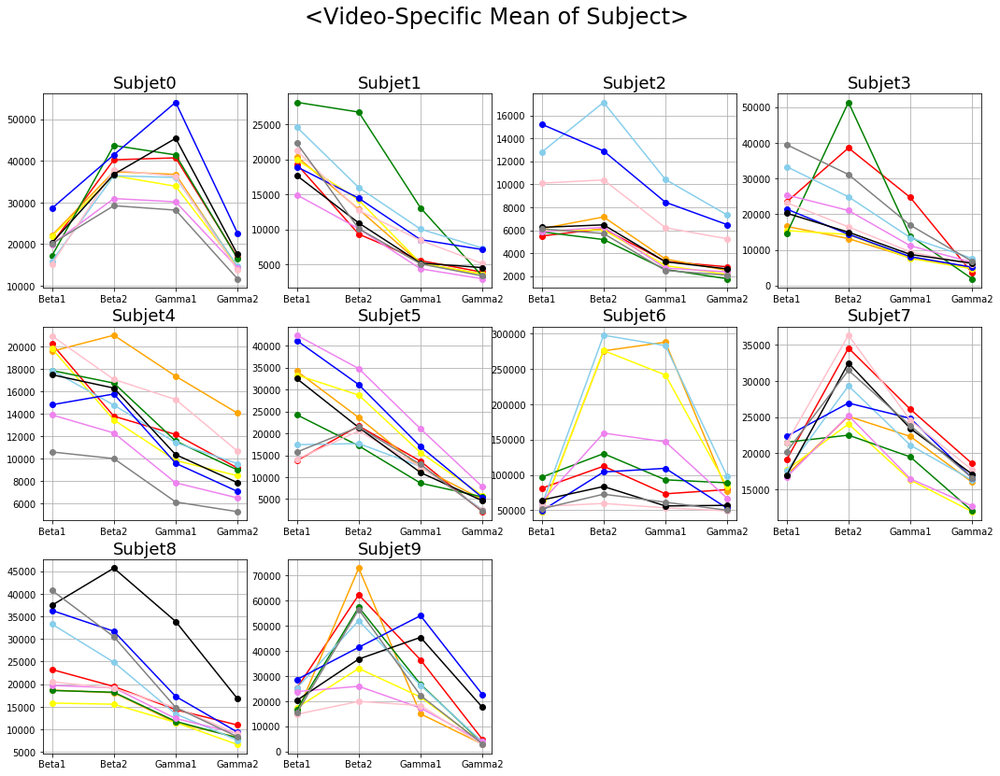

In [59]:
plt.figure(figsize=(18, 13)).suptitle("<Video-Specific Mean of Subject>",fontsize=24)

plt.subplot(341)
plt.plot(x,y0_1, color = 'red', marker = 'o', linestyle = '-')
plt.plot(x,y0_2, color = 'orange', marker = 'o', linestyle = '-')
plt.plot(x,y0_3, color = 'yellow', marker = 'o', linestyle = '-')
plt.plot(x,y0_4, color = 'green', marker = 'o', linestyle = '-')
plt.plot(x,y0_5, color = 'skyblue', marker = 'o', linestyle = '-')
plt.plot(x,y0_6, color = 'blue', marker = 'o', linestyle = '-')
plt.plot(x,y0_7, color = 'violet', marker = 'o', linestyle = '-')
plt.plot(x,y0_8, color = 'pink', marker = 'o', linestyle = '-')
plt.plot(x,y0_9, color = 'black', marker = 'o', linestyle = '-')
plt.plot(x,y0_10, color = 'gray', marker = 'o', linestyle = '-')
plt.title('Subjet0', fontsize=18)
plt.grid()

plt.subplot(342)
plt.plot(x,y1_1, color = 'red', marker = 'o', linestyle = '-')
plt.plot(x,y1_2, color = 'orange', marker = 'o', linestyle = '-')
plt.plot(x,y1_3, color = 'yellow', marker = 'o', linestyle = '-')
plt.plot(x,y1_4, color = 'green', marker = 'o', linestyle = '-')
plt.plot(x,y1_5, color = 'skyblue', marker = 'o', linestyle = '-')
plt.plot(x,y1_6, color = 'blue', marker = 'o', linestyle = '-')
plt.plot(x,y1_7, color = 'violet', marker = 'o', linestyle = '-')
plt.plot(x,y1_8, color = 'pink', marker = 'o', linestyle = '-')
plt.plot(x,y1_9, color = 'black', marker = 'o', linestyle = '-')
plt.plot(x,y1_10, color = 'gray', marker = 'o', linestyle = '-')
plt.title('Subjet1', fontsize=18)
plt.grid()

plt.subplot(343)
plt.plot(x,y2_1, color = 'red', marker = 'o', linestyle = '-')
plt.plot(x,y2_2, color = 'orange', marker = 'o', linestyle = '-')
plt.plot(x,y2_3, color = 'yellow', marker = 'o', linestyle = '-')
plt.plot(x,y2_4, color = 'green', marker = 'o', linestyle = '-')
plt.plot(x,y2_5, color = 'skyblue', marker = 'o', linestyle = '-')
plt.plot(x,y2_6, color = 'blue', marker = 'o', linestyle = '-')
plt.plot(x,y2_7, color = 'violet', marker = 'o', linestyle = '-')
plt.plot(x,y2_8, color = 'pink', marker = 'o', linestyle = '-')
plt.plot(x,y2_9, color = 'black', marker = 'o', linestyle = '-')
plt.plot(x,y2_10, color = 'gray', marker = 'o', linestyle = '-')
plt.title('Subjet2', fontsize=18)
plt.grid()

plt.subplot(344)
plt.plot(x,y3_1, color = 'red', marker = 'o', linestyle = '-')
plt.plot(x,y3_2, color = 'orange', marker = 'o', linestyle = '-')
plt.plot(x,y3_3, color = 'yellow', marker = 'o', linestyle = '-')
plt.plot(x,y3_4, color = 'green', marker = 'o', linestyle = '-')
plt.plot(x,y3_5, color = 'skyblue', marker = 'o', linestyle = '-')
plt.plot(x,y3_6, color = 'blue', marker = 'o', linestyle = '-')
plt.plot(x,y3_7, color = 'violet', marker = 'o', linestyle = '-')
plt.plot(x,y3_8, color = 'pink', marker = 'o', linestyle = '-')
plt.plot(x,y3_9, color = 'black', marker = 'o', linestyle = '-')
plt.plot(x,y3_10, color = 'gray', marker = 'o', linestyle = '-')
plt.title('Subjet3', fontsize=18)
plt.grid()

plt.subplot(345)
plt.plot(x,y4_1, color = 'red', marker = 'o', linestyle = '-')
plt.plot(x,y4_2, color = 'orange', marker = 'o', linestyle = '-')
plt.plot(x,y4_3, color = 'yellow', marker = 'o', linestyle = '-')
plt.plot(x,y4_4, color = 'green', marker = 'o', linestyle = '-')
plt.plot(x,y4_5, color = 'skyblue', marker = 'o', linestyle = '-')
plt.plot(x,y4_6, color = 'blue', marker = 'o', linestyle = '-')
plt.plot(x,y4_7, color = 'violet', marker = 'o', linestyle = '-')
plt.plot(x,y4_8, color = 'pink', marker = 'o', linestyle = '-')
plt.plot(x,y4_9, color = 'black', marker = 'o', linestyle = '-')
plt.plot(x,y4_10, color = 'gray', marker = 'o', linestyle = '-')
plt.title('Subjet4', fontsize=18)
plt.grid()

plt.subplot(346)
plt.plot(x,y5_1, color = 'red', marker = 'o', linestyle = '-')
plt.plot(x,y5_2, color = 'orange', marker = 'o', linestyle = '-')
plt.plot(x,y5_3, color = 'yellow', marker = 'o', linestyle = '-')
plt.plot(x,y5_4, color = 'green', marker = 'o', linestyle = '-')
plt.plot(x,y5_5, color = 'skyblue', marker = 'o', linestyle = '-')
plt.plot(x,y5_6, color = 'blue', marker = 'o', linestyle = '-')
plt.plot(x,y5_7, color = 'violet', marker = 'o', linestyle = '-')
plt.plot(x,y5_8, color = 'pink', marker = 'o', linestyle = '-')
plt.plot(x,y5_9, color = 'black', marker = 'o', linestyle = '-')
plt.plot(x,y5_10, color = 'gray', marker = 'o', linestyle = '-')
plt.title('Subjet5', fontsize=18)
plt.grid()

plt.subplot(347)
plt.plot(x,y6_1, color = 'red', marker = 'o', linestyle = '-')
plt.plot(x,y6_2, color = 'orange', marker = 'o', linestyle = '-')
plt.plot(x,y6_3, color = 'yellow', marker = 'o', linestyle = '-')
plt.plot(x,y6_4, color = 'green', marker = 'o', linestyle = '-')
plt.plot(x,y6_5, color = 'skyblue', marker = 'o', linestyle = '-')
plt.plot(x,y6_6, color = 'blue', marker = 'o', linestyle = '-')
plt.plot(x,y6_7, color = 'violet', marker = 'o', linestyle = '-')
plt.plot(x,y6_8, color = 'pink', marker = 'o', linestyle = '-')
plt.plot(x,y6_9, color = 'black', marker = 'o', linestyle = '-')
plt.plot(x,y6_10, color = 'gray', marker = 'o', linestyle = '-')
plt.title('Subjet6', fontsize=18)
plt.grid()

plt.subplot(348)
plt.plot(x,y7_1, color = 'red', marker = 'o', linestyle = '-')
plt.plot(x,y7_2, color = 'orange', marker = 'o', linestyle = '-')
plt.plot(x,y7_3, color = 'yellow', marker = 'o', linestyle = '-')
plt.plot(x,y7_4, color = 'green', marker = 'o', linestyle = '-')
plt.plot(x,y7_5, color = 'skyblue', marker = 'o', linestyle = '-')
plt.plot(x,y7_6, color = 'blue', marker = 'o', linestyle = '-')
plt.plot(x,y7_7, color = 'violet', marker = 'o', linestyle = '-')
plt.plot(x,y7_8, color = 'pink', marker = 'o', linestyle = '-')
plt.plot(x,y7_9, color = 'black', marker = 'o', linestyle = '-')
plt.plot(x,y7_10, color = 'gray', marker = 'o', linestyle = '-')
plt.title('Subjet7', fontsize=18)
plt.grid()

plt.subplot(349)
plt.plot(x,y8_1, color = 'red', marker = 'o', linestyle = '-')
plt.plot(x,y8_2, color = 'orange', marker = 'o', linestyle = '-')
plt.plot(x,y8_3, color = 'yellow', marker = 'o', linestyle = '-')
plt.plot(x,y8_4, color = 'green', marker = 'o', linestyle = '-')
plt.plot(x,y8_5, color = 'skyblue', marker = 'o', linestyle = '-')
plt.plot(x,y8_6, color = 'blue', marker = 'o', linestyle = '-')
plt.plot(x,y8_7, color = 'violet', marker = 'o', linestyle = '-')
plt.plot(x,y8_8, color = 'pink', marker = 'o', linestyle = '-')
plt.plot(x,y8_9, color = 'black', marker = 'o', linestyle = '-')
plt.plot(x,y8_10, color = 'gray', marker = 'o', linestyle = '-')
plt.title('Subjet8', fontsize=18)
plt.grid()

oFig1 = plt.figure(1)
oFig1.add_subplot(3,4,10)
plt.plot(x,y9_1, color = 'red', marker = 'o', linestyle = '-')
plt.plot(x,y9_2, color = 'orange', marker = 'o', linestyle = '-')
plt.plot(x,y9_3, color = 'yellow', marker = 'o', linestyle = '-')
plt.plot(x,y9_4, color = 'green', marker = 'o', linestyle = '-')
plt.plot(x,y9_5, color = 'skyblue', marker = 'o', linestyle = '-')
plt.plot(x,y9_6, color = 'blue', marker = 'o', linestyle = '-')
plt.plot(x,y9_7, color = 'violet', marker = 'o', linestyle = '-')
plt.plot(x,y9_8, color = 'pink', marker = 'o', linestyle = '-')
plt.plot(x,y9_9, color = 'black', marker = 'o', linestyle = '-')
plt.plot(x,y9_10, color = 'gray', marker = 'o', linestyle = '-')
plt.title('Subjet9', fontsize=18)
plt.grid()

## (6) 결론

In [60]:
df1 = df.loc[df['user-definedlabeln'] == 1, 'SubjectID':'VideoID']
df2 = df.loc[df['user-definedlabeln'] == 1, 'user-definedlabeln']
Confused_Subject = pd.concat([df1, df2], axis=1)
Confused_Subject = Confused_Subject.drop_duplicates(['SubjectID', 'VideoID'], keep='first')
Confused_Subject

,SubjectID,VideoID,user-definedlabeln
144,0,1,1
284,0,2,1
664,0,5,1
787,0,6,1
1015,0,8,1
1401,1,1,1
1543,1,2,1
1665,1,3,1
1781,1,4,1
2702,2,1,1


In [61]:
Confused_Video_0 = Confused_Subject.loc[Confused_Subject['VideoID'] == 0, : ]
Confused_Video_1 = Confused_Subject.loc[Confused_Subject['VideoID'] == 1, : ]
Confused_Video_2 = Confused_Subject.loc[Confused_Subject['VideoID'] == 2, : ]
Confused_Video_3 = Confused_Subject.loc[Confused_Subject['VideoID'] == 3, : ]
Confused_Video_4 = Confused_Subject.loc[Confused_Subject['VideoID'] == 4, : ]
Confused_Video_5 = Confused_Subject.loc[Confused_Subject['VideoID'] == 5, : ]
Confused_Video_6 = Confused_Subject.loc[Confused_Subject['VideoID'] == 6, : ]
Confused_Video_7 = Confused_Subject.loc[Confused_Subject['VideoID'] == 7, : ]
Confused_Video_8 = Confused_Subject.loc[Confused_Subject['VideoID'] == 8, : ]
Confused_Video_9 = Confused_Subject.loc[Confused_Subject['VideoID'] == 9, : ]

In [62]:
df_list= [Confused_Video_0,
          Confused_Video_1,
          Confused_Video_2,
          Confused_Video_3,
          Confused_Video_4,
          Confused_Video_5,
          Confused_Video_6,
          Confused_Video_7,
          Confused_Video_8,
          Confused_Video_9,]
df_confused_video = list(map(lambda x:len(x), df_list))

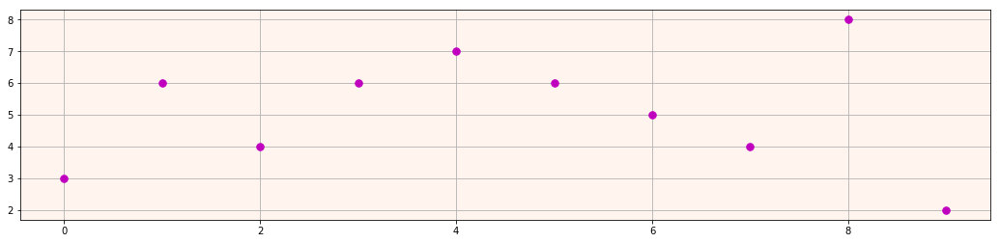

In [63]:
x = range(0, 10)
y = df_confused_video
plt.figure(figsize=(18,4))
ax = plt.axes()
ax.set_facecolor("seashell")
plt.plot(x, y,'m.', markersize = 15)
plt.title('', fontsize=18)
plt.grid()

### 베타, 감마파와 같은 빠른 진동성분이 많이 출현할 수록 더 혼란스러운 상태일 것이다. <br>

- **user-definedlabeln** 의 값이 1인 경우 혼란스러운 피실험자임을 기존의 가공되지 않은 데이터에서 알 수 있었다.
- 베타, 감마파가 많이 출현한 피실험자별 비디오의 뇌파 수치를 봤을 때 혼란스러운 상태임을 대부분 비례함을 통해 알 수 있었다.
- 하지만 모든 피실험자의 뇌파에서 베타, 감마파와 같은 뇌파보다, 델타, 세타파와 같은 뇌파의 수치가 더 높게 나타낸 이유는 알 수 없었다.<br>
- 뇌파 분야에 대한 domain knowledge가 없어서 그런 것이라 생각이 들었다.
    
### 혼란스러워하는 피실험자의 수가 많을수록 혼란스러운 영상일 것이다. <br>

- **user-definedlabeln** 의 값이 1인 경우 혼란스러운 영상일 것이라 생각해 비디오별 해당하는 횟수를 구하고 df를 만들었다.
- 그 df에서 횟수가 높을수록 더 혼란스러운 영상일 것이라 생각했다.
- 하지만 그래프의 상위를 차지하고 있는 영상과 피실험자별 빈도수는 경향이 달랐다.
- df에서는 8/4/1,3,5/6/2,7/0/9 순으로 빈도수가 높게 나타났고, 피실험자별 user-definedlabeln의 값이 1인 영상 상위 2개의 빈도수의 경우 4,5/8/6,7,9/0,1,3/2 순으로 나타났다.

### 아쉬웠던 점

- 다음에 뇌와 관련된 데이터를 분석할 때에는 좀 더 사전지식이 갖춰지면 좋을 것 같다는 생각을 했다.
- 어떤 결과가 이번 데이터 분석에서 의미있는 것인지, 어떤 방향으로 분석을 해야할지를 잘 파악을 못하고 그래프 그리는 것만 연습했던 것 같다.
- 마지막 subplot을 그릴 때 모두 같은 legend를 공유하고 있어서 전체 plot 에 대한 legend를 바깥에 만들어주려고 했지만 axes를 중심으로 그래프를 그린게 아니라 각각 위치를 지정하고 그래프를 그렸기 때문에 legend를 만들지 못했다.
- legend 를 만들었다면 제거하고 싶은 line을 10개의 그래프에서 한 번에 지우고 결과를 해석해볼 수 있었을텐데라는 아쉬움이 남는다.
- axes 를 중심으로 그래프를 그리는 방법을 더 공부해볼 것이다.

## (7) 참고문헌

##### plotly
- https://plot.ly/python/setting-graph-size/
- https://plot.ly/python/dot-plots/
- https://plot.ly/python/line-and-scatter/
- https://plot.ly/python/reference/#scatter
- https://plot.ly/python/v3/line-charts/
- https://plot.ly/python/line-charts/
- https://plot.ly/python/line-charts/#line-plot-with-goscatter
- https://plot.ly/python/creating-and-updating-figures/
- https://dash-gallery.plotly.host/Portal/
- https://plot.ly/python/time-series/
<br><br>
- https://ssoonidev.tistory.com/52 (subplot)
- http://hleecaster.com/python-matplotlib-line-graph/ (multiple graph)
- https://nittaku.tistory.com/111
- https://nittaku.tistory.com/117 (color, marker, linestyle)
- https://nittaku.tistory.com/121
- http://blog.naver.com/PostView.nhn?blogId=radii26omg&logNo=221020314455 (color chart)
- https://javan.tistory.com/3 (df.drop_duplicates)
<br><br>
- https://stackoverflow.com/questions/27016904/matplotlib-legends-in-subplot (legend)
- https://stackoverflow.com/questions/4158367/more-than-9-subplots-in-matplotlib
- https://dandyrilla.github.io/2017-08-12/pandas-10min/
- https://codeday.me/ko/qa/20190526/631473.html
<br><br>
- seaborn
- https://pinkwink.kr/986 
- https://nonmeyet.tistory.com/entry/Python-seaborn%EC%9D%84-%EC%82%AC%EC%9A%A9%ED%95%9C-%EB%8D%B0%EC%9D%B4%ED%84%B0-%EC%8B%9C%EA%B0%81%ED%99%94-2
- https://datascienceschool.net/view-notebook/4c2d5ff1caab4b21a708cc662137bc65/